# Combined Analysis Report

This notebook renders each report section followed immediately by its referenced figures and tables.



In [1]:
from pathlib import Path
from IPython.display import display, Markdown, Image
import pandas as pd
import re
from typing import Optional

BASE = Path('/Users/sinaelahimanesh/Documents/Saarland/CIX/Data Analysis')
QDIR = BASE / 'outputs' / 'questionnaire'
LDIR = BASE / 'outputs' / 'logs'

def show_csv(path: Path, head=None):
    if path.exists():
        df = pd.read_csv(path)
        display(Markdown(f"### {path.name}"))
        display(df if head is None else df.head(head))

def show_image(path: Path, width=700):
    if path.exists():
        display(Markdown(f"#### {path.name}"))
        display(Image(filename=str(path), width=width))

def split_sections(md_text: str):
    lines = md_text.splitlines()
    sections = []
    current_title = None
    current_lines = []
    for ln in lines:
        if ln.startswith('## '):
            if current_title is not None:
                sections.append((current_title, '\n'.join(current_lines).strip()))
            current_title = ln[3:].strip()
            current_lines = []
        elif ln.startswith('### '):
            if current_title is not None:
                sections.append((current_title, '\n'.join(current_lines).strip()))
            current_title = ln[4:].strip()
            current_lines = []
        else:
            current_lines.append(ln)
    if current_title is not None:
        sections.append((current_title, '\n'.join(current_lines).strip()))
    return sections

def _resolve(rel: str, base_dir: Path) -> Optional[Path]:
    rel = rel.strip()
    p = Path(rel)
    if p.is_absolute() and p.exists():
        return p
    if rel.startswith('outputs/') and (BASE / rel).exists():
        return BASE / rel
    if (base_dir / rel).exists():
        return base_dir / rel
    return None

_IMG_PAT_BT = re.compile(r"`([^`]+?\.(?:png|jpg|jpeg|gif|webp))`", re.IGNORECASE)
_IMG_PAT_NK = re.compile(r"(?<![\w/])([\w./-]+\.(?:png|jpg|jpeg|gif|webp))", re.IGNORECASE)
_CSV_PAT_BT = re.compile(r"`([^`]+?\.csv)`", re.IGNORECASE)
_CSV_PAT_NK = re.compile(r"(?<![\w/])([\w./-]+\.csv)", re.IGNORECASE)

def render_inline_images(md_text: str, base_dir: Path) -> None:
    for m in _IMG_PAT_BT.finditer(md_text):
        p = _resolve(m.group(1), base_dir)
        if p is not None:
            show_image(p)
    for m in _IMG_PAT_NK.finditer(md_text):
        p = _resolve(m.group(1), base_dir)
        if p is not None:
            show_image(p)

def render_inline_csvs(md_text: str, base_dir: Path) -> None:
    for m in _CSV_PAT_BT.finditer(md_text):
        p = _resolve(m.group(1), base_dir)
        if p is not None:
            show_csv(p, head=None)
    for m in _CSV_PAT_NK.finditer(md_text):
        p = _resolve(m.group(1), base_dir)
        if p is not None:
            show_csv(p, head=None)

def _iter_list_blocks(md_text: str, header: str):
    lines = md_text.splitlines()
    i = 0
    while i < len(lines):
        if lines[i].strip().lower().startswith(header.lower()):
            i += 1
            block = []
            while i < len(lines):
                s = lines[i]
                if s.strip().startswith(('-', '*')):
                    block.append(s)
                    i += 1
                elif s.strip() == '':
                    i += 1
                    break
                else:
                    break
            if block:
                yield block
        else:
            i += 1

def render_assets_from_lists(md_text: str, base_dir: Path) -> None:
    for block in _iter_list_blocks(md_text, 'Figures:'):
        for line in block:
            m = _IMG_PAT_BT.search(line) or _IMG_PAT_NK.search(line)
            if m:
                p = _resolve(m.group(1), base_dir)
                if p is not None:
                    show_image(p)
    for block in _iter_list_blocks(md_text, 'Data:'):
        for line in block:
            m = _CSV_PAT_BT.search(line) or _CSV_PAT_NK.search(line)
            if m:
                p = _resolve(m.group(1), base_dir)
                if p is not None:
                    show_csv(p, head=None)



## Demographics (Questionnaire)

Data: `outputs/questionnaire/demographics_summary.csv`, `outputs/questionnaire/demographics_gender.csv`, `outputs/questionnaire/demographics_language.csv`, `outputs/questionnaire/demographics_xr_distribution.csv`, `outputs/questionnaire/demographics_videogame_distribution.csv`

- Participants: 19 (unique)
- Age: mean 36.5 (std=11.0) (min 23, max 60)
- Gender: Male 10, Female 9
- XR experience (1–7): mean 1.53 (std=0.84); distribution in `demographics_xr_distribution.csv`
- Videogame experience (1–7): mean 4.05 (std=1.99); distribution in `demographics_videogame_distribution.csv`

Figures:
- `figs/age_histogram.png`
- `figs/gender_distribution.png`
- `figs/xr_experience_distribution.png`
- `figs/videogame_experience_distribution.png`

---

#### age_histogram.png

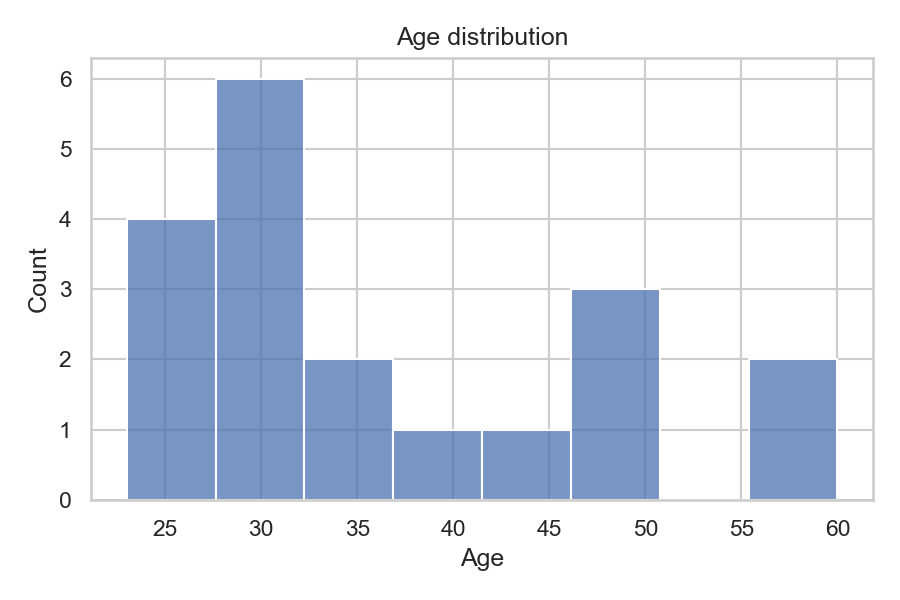

#### gender_distribution.png

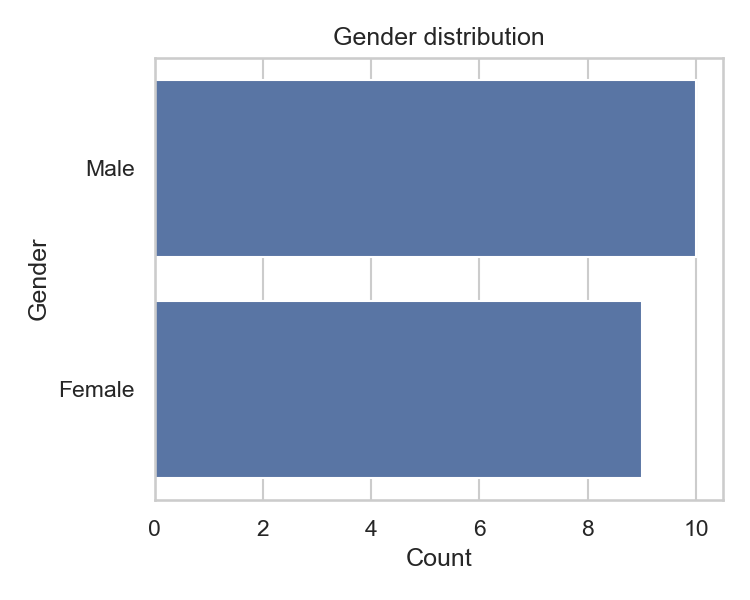

#### xr_experience_distribution.png

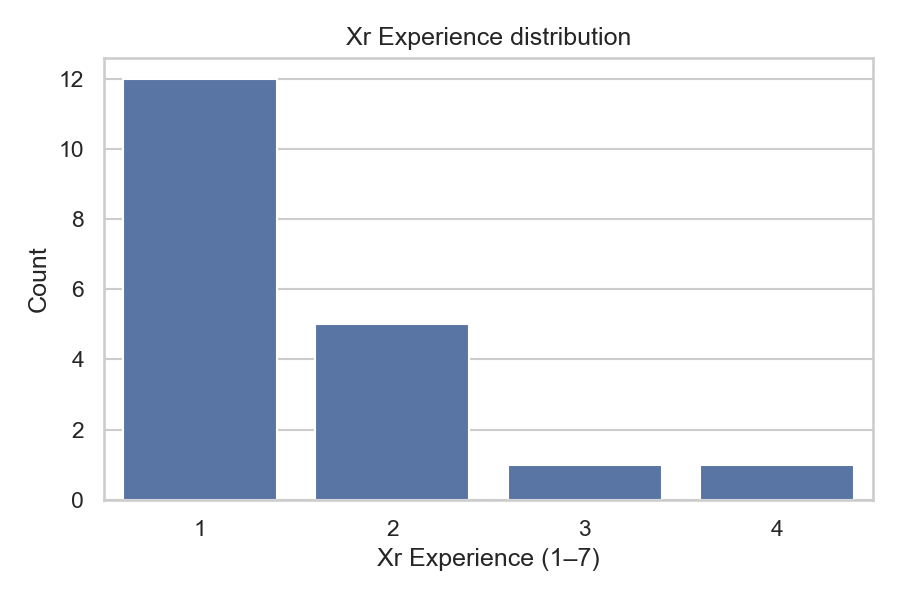

#### videogame_experience_distribution.png

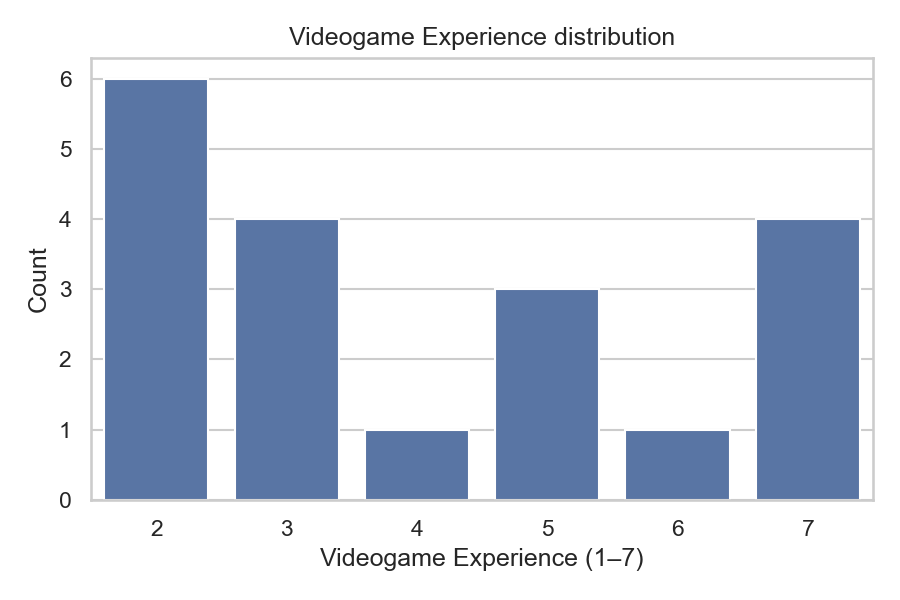

#### age_histogram.png

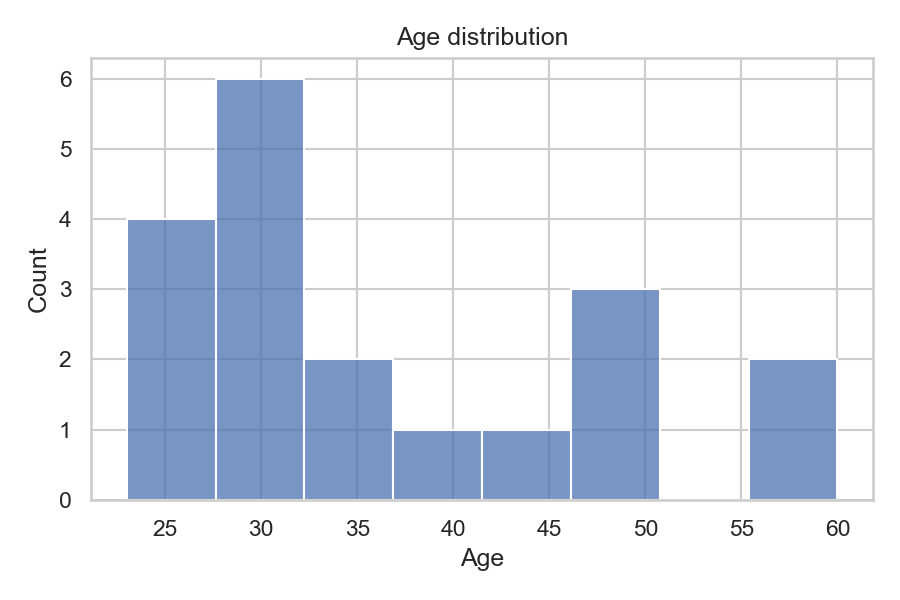

#### gender_distribution.png

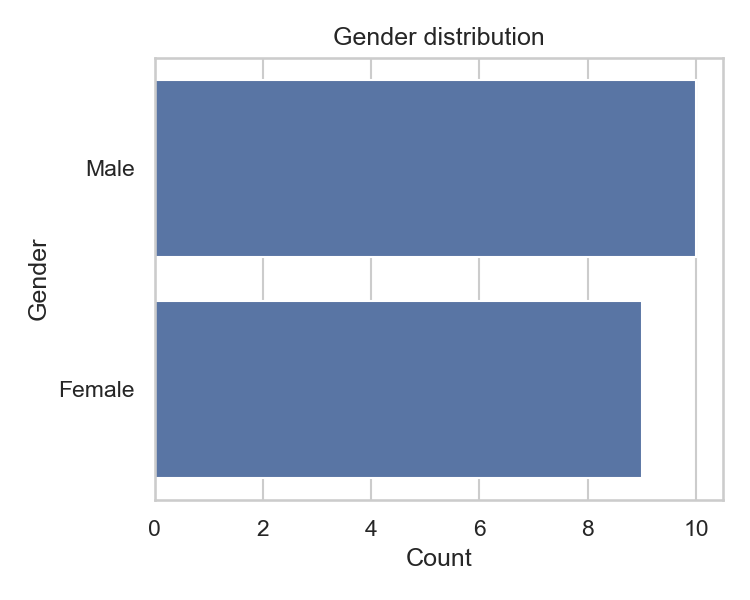

#### xr_experience_distribution.png

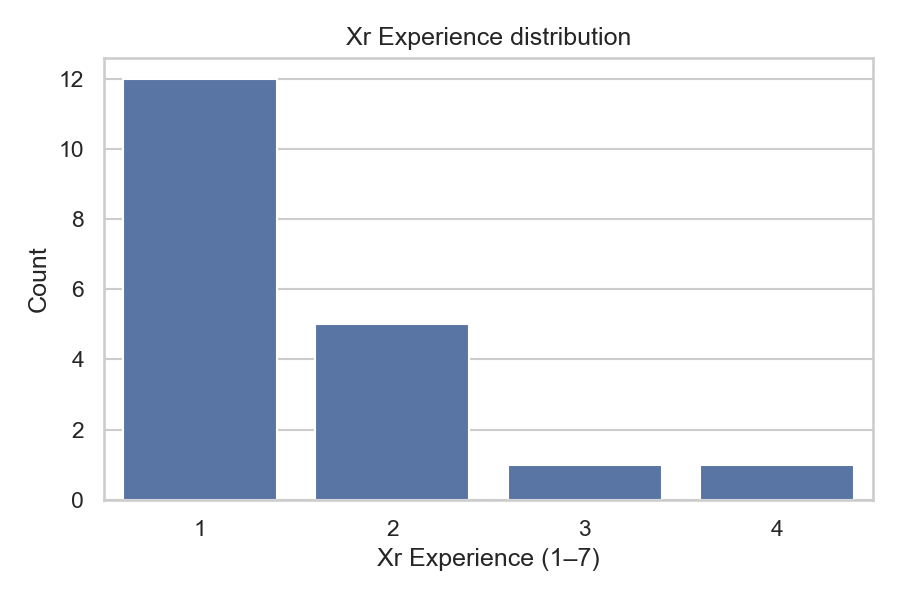

#### videogame_experience_distribution.png

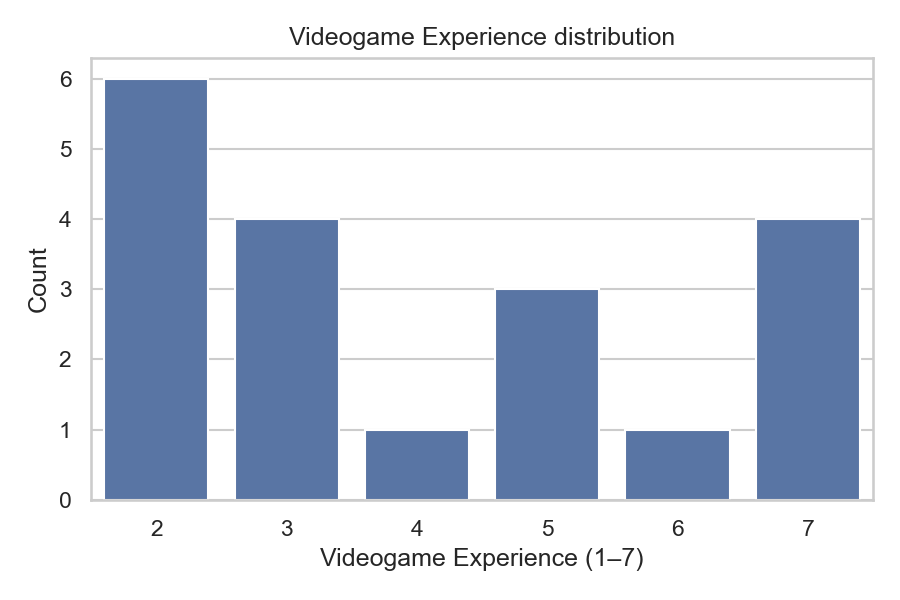

### demographics_summary.csv

,num_participants,age_mean,age_std,age_min,age_max,xr_experience_mean,xr_experience_std,videogame_experience_mean,videogame_experience_std
0,19,36.526316,10.971521,23.0,60.0,1.526316,0.841191,4.052632,1.985326


### demographics_gender.csv

,gender,count
0,Male,10
1,Female,9


### demographics_language.csv

,language,count
0,Português (Portugal)?,19


### demographics_xr_distribution.csv

,xr_experience,count
0,1.0,12
1,2.0,5
2,3.0,1
3,4.0,1


### demographics_videogame_distribution.csv

,videogame_experience,count
0,2.0,6
1,3.0,4
2,4.0,1
3,5.0,3
4,6.0,1
5,7.0,4


### demographics_xr_distribution.csv

,xr_experience,count
0,1.0,12
1,2.0,5
2,3.0,1
3,4.0,1


### demographics_videogame_distribution.csv

,videogame_experience,count
0,2.0,6
1,3.0,4
2,4.0,1
3,5.0,3
4,6.0,1
5,7.0,4


### demographics_summary.csv

,num_participants,age_mean,age_std,age_min,age_max,xr_experience_mean,xr_experience_std,videogame_experience_mean,videogame_experience_std
0,19,36.526316,10.971521,23.0,60.0,1.526316,0.841191,4.052632,1.985326


### demographics_gender.csv

,gender,count
0,Male,10
1,Female,9


### demographics_language.csv

,language,count
0,Português (Portugal)?,19


### demographics_xr_distribution.csv

,xr_experience,count
0,1.0,12
1,2.0,5
2,3.0,1
3,4.0,1


### demographics_videogame_distribution.csv

,videogame_experience,count
0,2.0,6
1,3.0,4
2,4.0,1
3,5.0,3
4,6.0,1
5,7.0,4


### demographics_xr_distribution.csv

,xr_experience,count
0,1.0,12
1,2.0,5
2,3.0,1
3,4.0,1


### demographics_videogame_distribution.csv

,videogame_experience,count
0,2.0,6
1,3.0,4
2,4.0,1
3,5.0,3
4,6.0,1
5,7.0,4


#### age_histogram.png

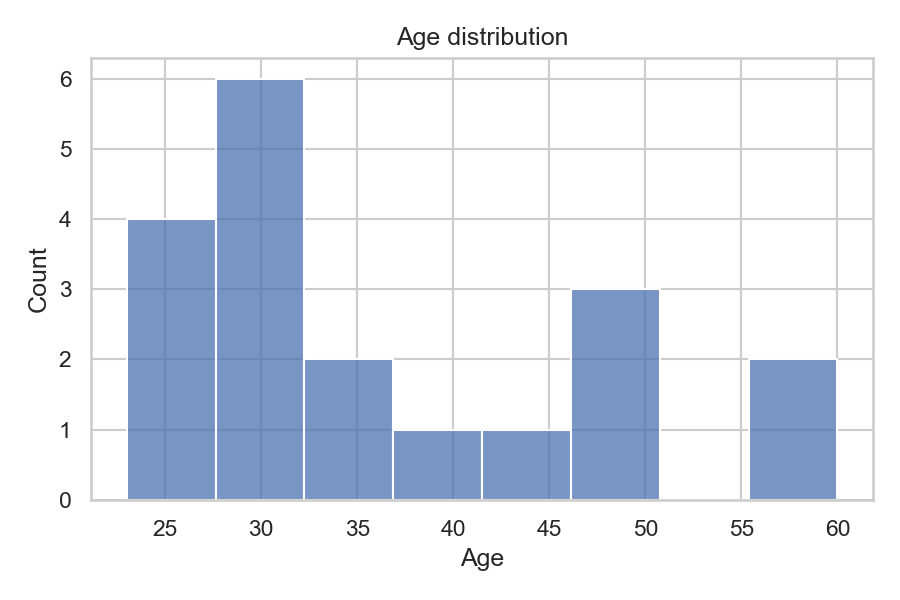

#### gender_distribution.png

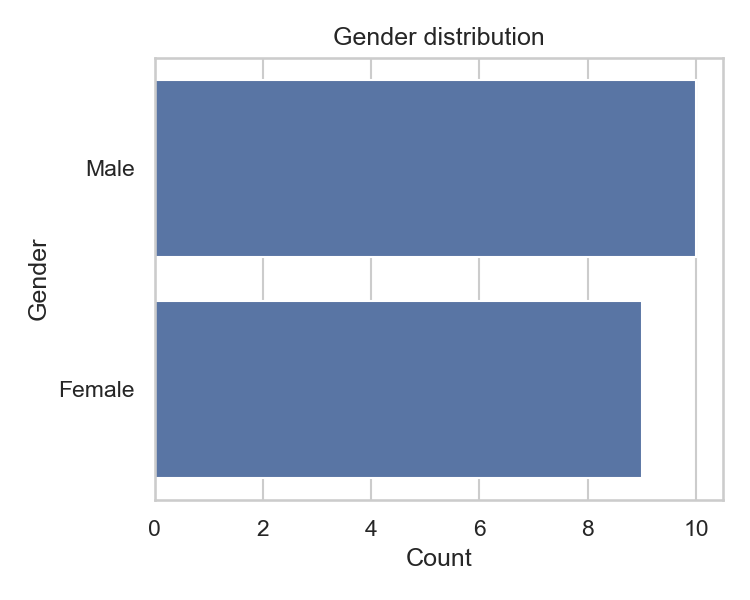

#### xr_experience_distribution.png

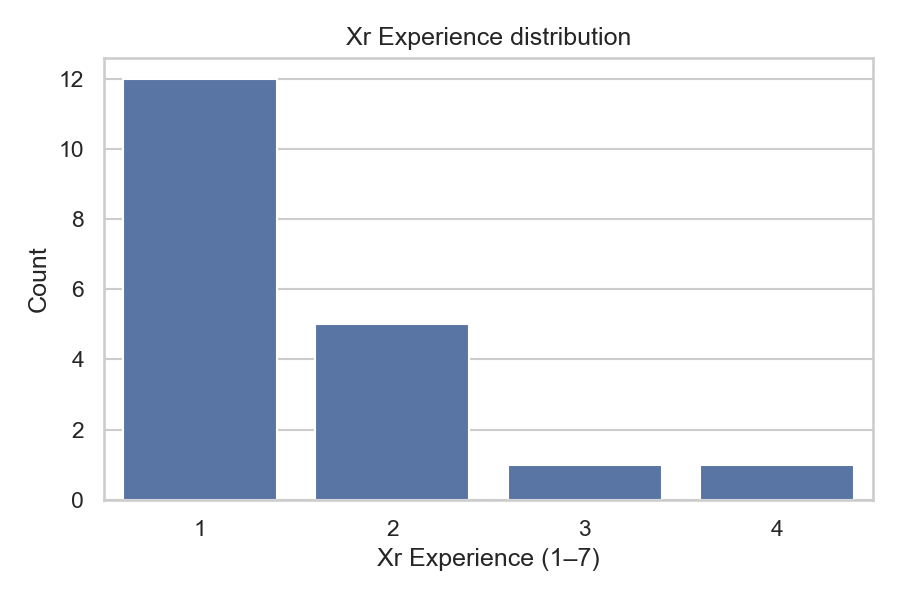

#### videogame_experience_distribution.png

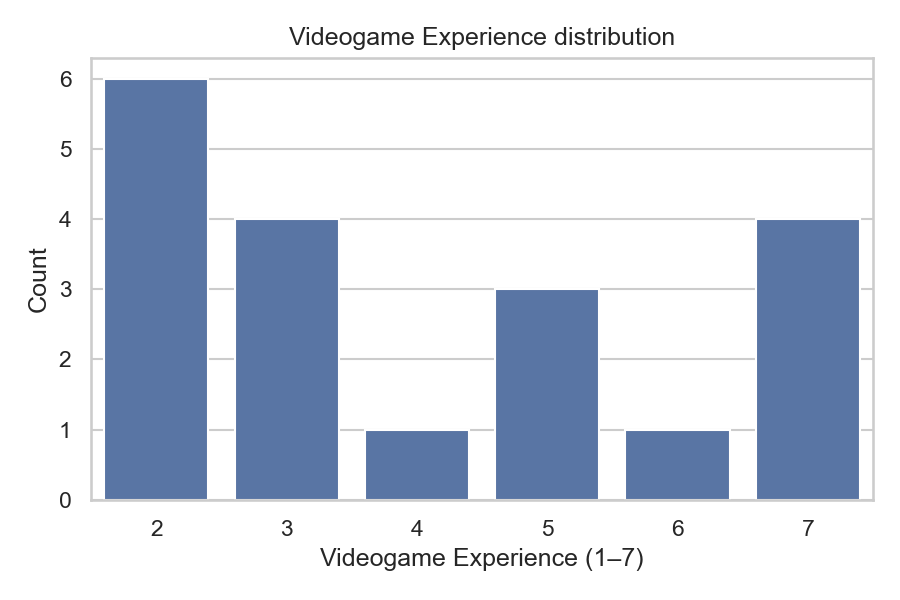

## Data Analysis Report - Questionnaire

## Dataset overview

- Participants: 19
- Trials: 57 (one per condition per participant: Stationary, Semi-Stationary, Moving)
- Tasks: Key, Visual, Controls
- Anchors: World, Head, Torso, Arm
- Measures: 1–7 ratings per task×anchor, planned anchor rankings, demographics, free-text comments

## Methods summary

- Preprocessing: normalized encodings/headers; long-form ratings; extracted planned top per task; unified comments; attached conditions to every trial.
- Quantitative:
  - Descriptive means/medians/std per condition×task×anchor
  - Preference distributions: “planned top” counts and proportions per condition×task
  - Repeated-measures Friedman tests within task across anchors, computed separately per condition
  - Condition effects via Kruskal–Wallis per (task, anchor)
  - Correlations: Spearman (avg ease vs age/xr/game) on participant aggregates; χ² (planned top vs condition at trial-level; vs gender at participant-level)
  - Consistency: planned vs top-rated agreement computed per participant×condition×task, summarized by condition×task
- Qualitative: seeded themes (visibility, obstruction, stability, interaction, convenience), TF‑IDF by condition, representative quotes
- Mixed methods: triangulated numeric top anchors vs top-mentioned anchors per condition×task; participant–condition profiles

---

## 1) Quantitative results and interpretation

## 1.1 Descriptive statistics (ease ratings)

Data: `outputs/desc_by_condition.csv`

#### Stationary (clear preference for World)
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | **7.00 (std=0.00)** | 4.00 (std=1.83) | 3.95 (std=1.61) | 2.63 (std=1.38) |
| Visual | **7.00 (std=0.00)** | 3.89 (std=1.76) | 4.26 (std=1.69) | 2.79 (std=1.36) |
| Controls | **6.84 (std=0.50)** | 4.05 (std=1.93) | 4.32 (std=1.34) | 3.26 (std=1.79) |

#### Moving (body anchors outperform World)
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | 2.32 (std=1.83) | 5.53 (std=1.74) | **5.95 (std=1.13)** | 3.84 (std=1.83) |
| Visual | 2.37 (std=1.67) | 4.89 (std=1.70) | **6.16 (std=1.01)** | 4.16 (std=1.68) |
| Controls | 2.16 (std=1.50) | 5.00 (std=1.80) | 5.42 (std=1.22) | **5.79 (std=1.55)** |

#### Semi-Stationary (Torso/Arm are strong, World mixed)
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | 4.89 (std=2.26) | 4.95 (std=1.78) | **5.37 (std=1.46)** | 3.74 (std=1.82) |
| Visual | 3.11 (std=1.85) | 5.11 (std=2.08) | **5.95 (std=1.35)** | 3.79 (std=1.58) |
| Controls | 2.68 (std=1.73) | 4.79 (std=1.84) | **5.42 (std=1.17)** | 5.37 (std=2.11) |

Findings: When users are stationary, world-fixed UIs are unequivocally easiest across all tasks (means ≥ 6.84), confirming that stability in the environment maximizes usability. As soon as users move, the numeric center shifts to body-anchored references: torso for continuous-view tasks (Key/Visual) and arm for quick input (Controls). Semi‑stationary lies between, with torso consistently strong and world no longer competitive for Visual/Controls. These patterns corroborate the intuition that optimal anchoring depends jointly on motion and task modality (continuous monitoring vs discrete control).

Figures:
- Heatmaps (mean ease) per task:
  - `figs/heatmap_key.png`
  - `figs/heatmap_visual.png`
  - `figs/heatmap_controls.png`

#### heatmap_key.png

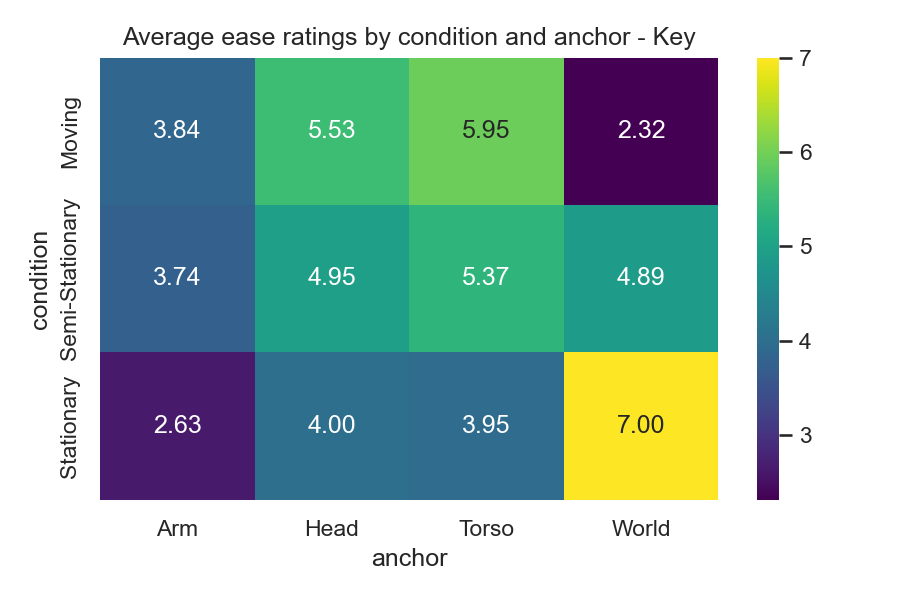

#### heatmap_visual.png

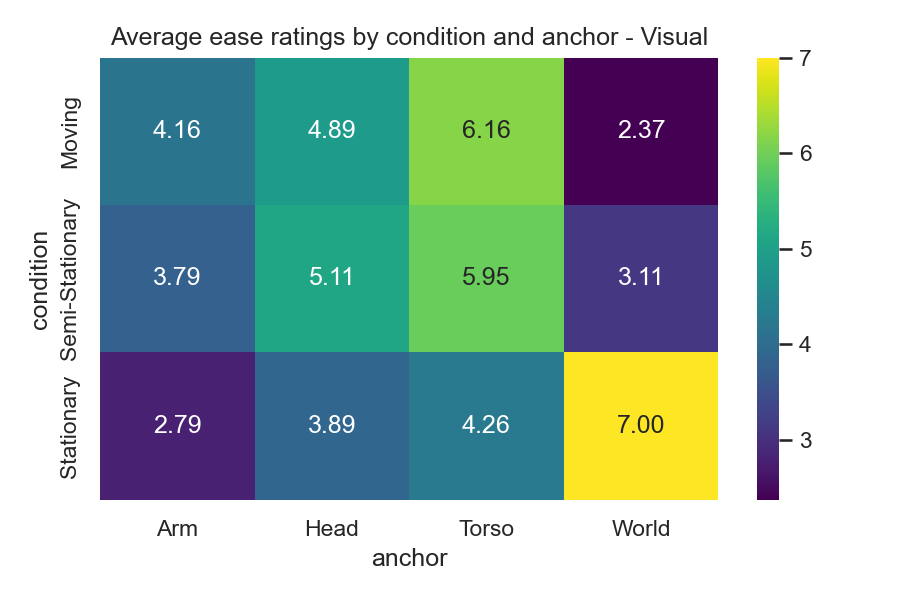

#### heatmap_controls.png

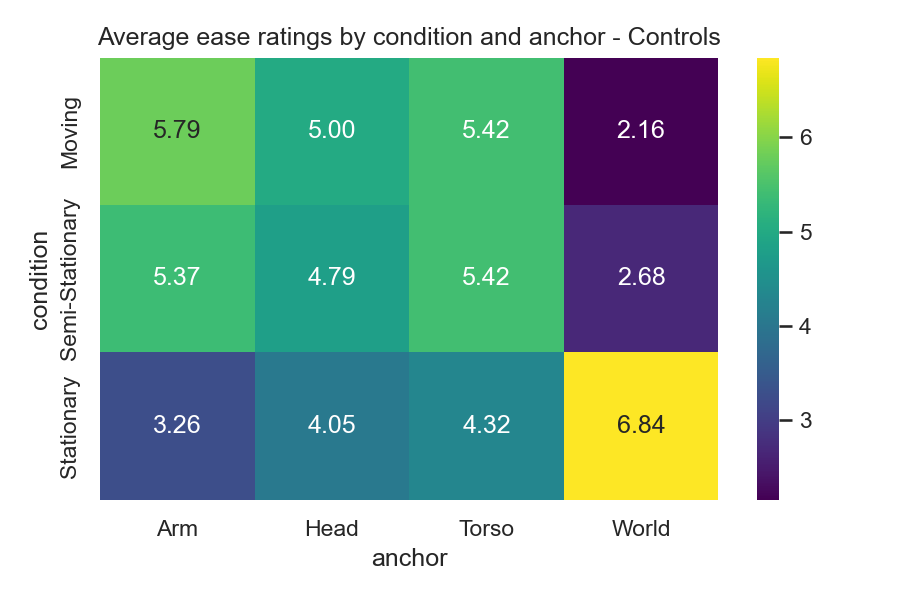

#### heatmap_key.png

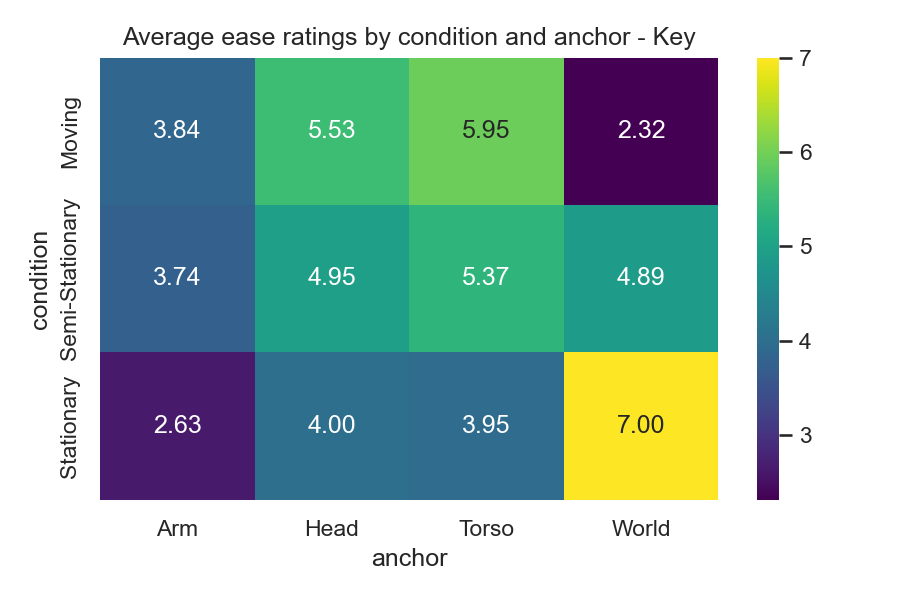

#### heatmap_visual.png

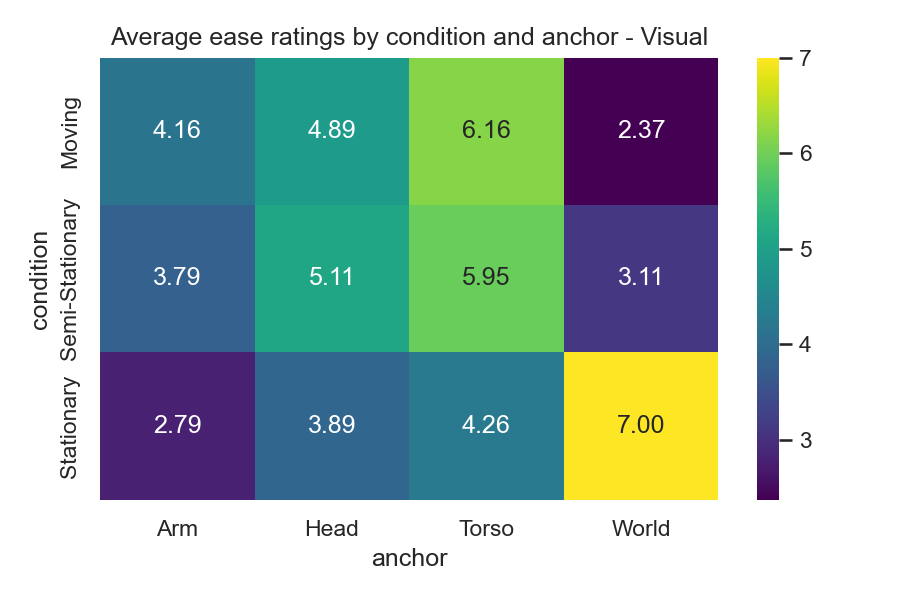

#### heatmap_controls.png

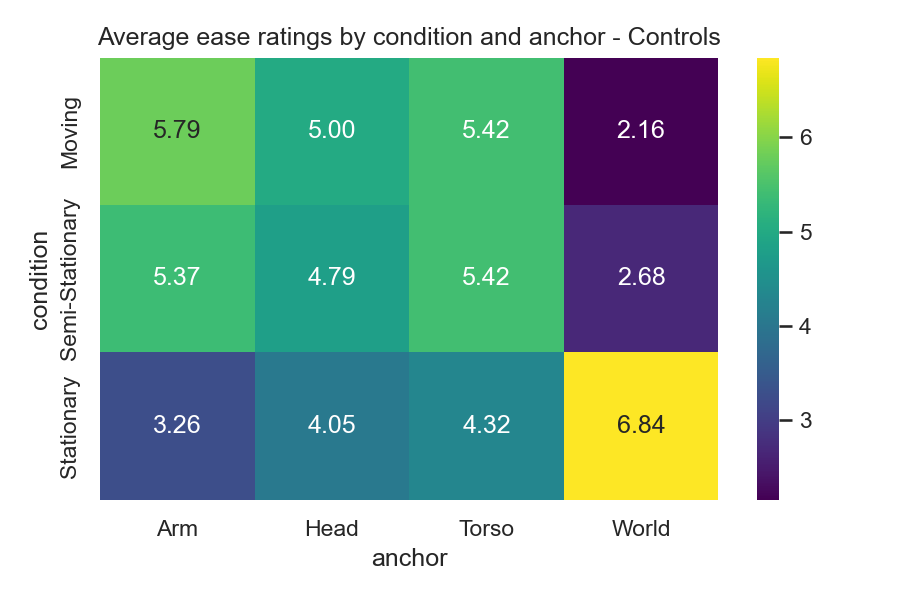

#### heatmap_key.png

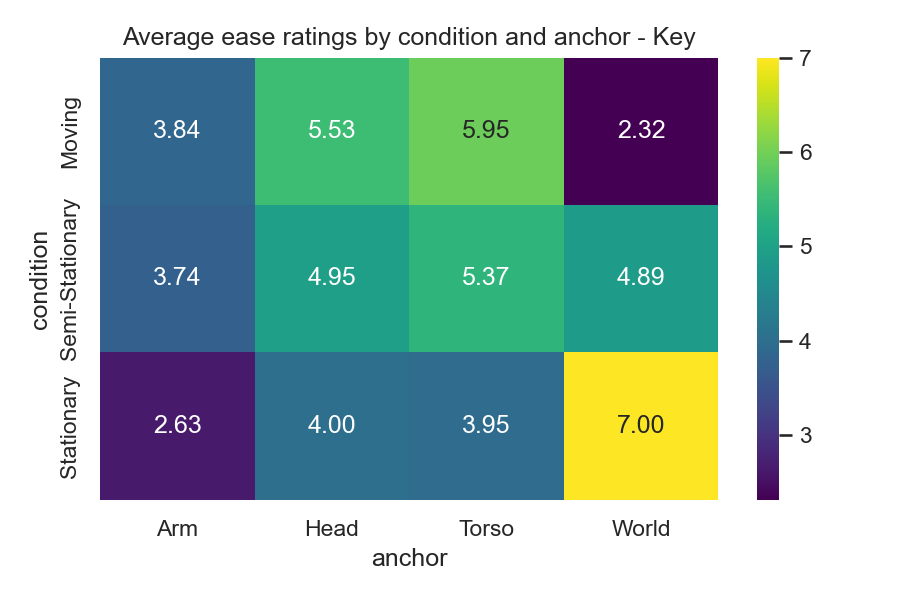

#### heatmap_visual.png

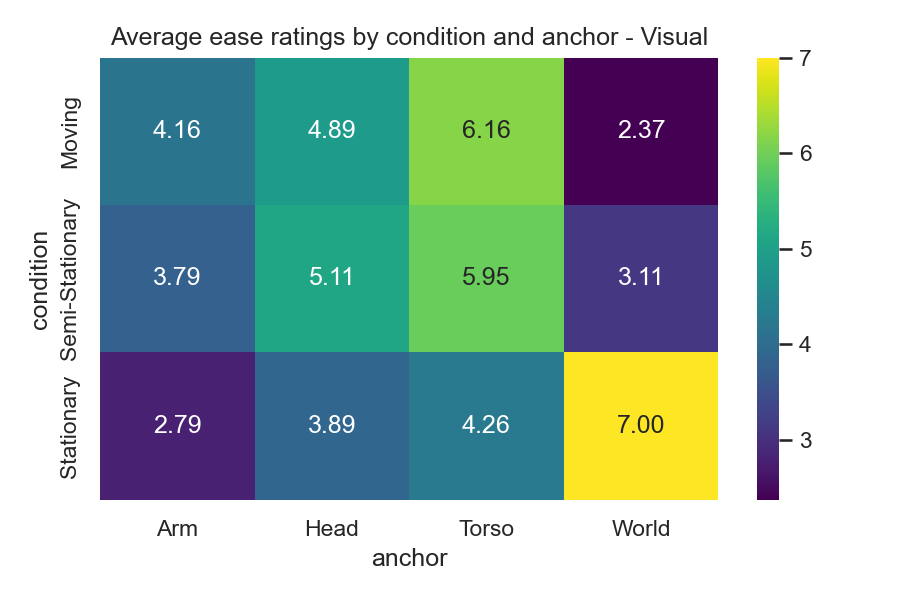

#### heatmap_controls.png

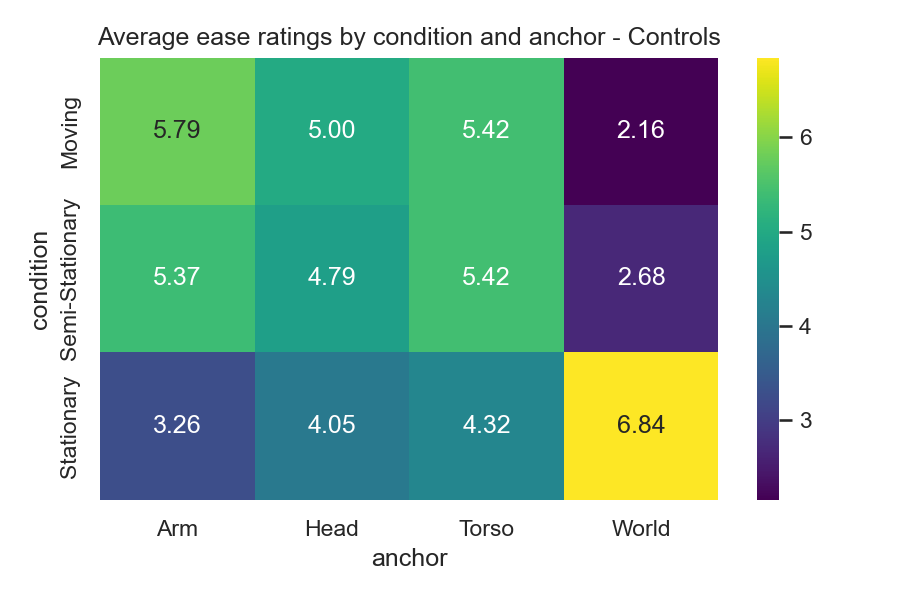

## 1.2 Preference distributions (planned top anchors)

Data: `outputs/preference_distribution.csv`

| Condition | Task     | World  | Head   | Torso  | Arm    |
|---|---|---|---|---|---|
| Stationary | Key      | **100%**   |        |        |        |
| Stationary | Visual   | **100%**   |        |        |        |
| Stationary | Controls | **94.7%**  |        |        | 5.3%   |
| Moving     | Key      | 5.3%   | **42.1%**  | 36.8%  | 15.8%  |
| Moving     | Visual   |        | 31.6%  | **47.4%**  | 21.1%  |
| Moving     | Controls |        | 26.3%  | 15.8%  | **57.9%**  |
| Semi-Stationary | Key      | **42.1%**  | 31.6%  | 15.8%  | 10.5%  |
| Semi-Stationary | Visual   | 5.3%   | 42.1%  | **47.4%**  | 5.3%   |
| Semi-Stationary | Controls | 5.3%   | 21.1%  | 15.8%  | **57.9%**  |

Findings: Planned choices mirror the descriptive means: stationary users overwhelmingly plan for world anchoring; moving users gravitate to torso/head for Key/Visual and to arm for Controls; semi‑stationary preferences split between world/torso for Key and torso/head for Visual. This pre‑trial signal anticipates final experience and thus is a strong prior for adaptive systems.

Figures:
- Preference bar charts per task:
  - `figs/pref_barchart_key.png`
  - `figs/pref_barchart_visual.png`
  - `figs/pref_barchart_controls.png`

#### pref_barchart_key.png

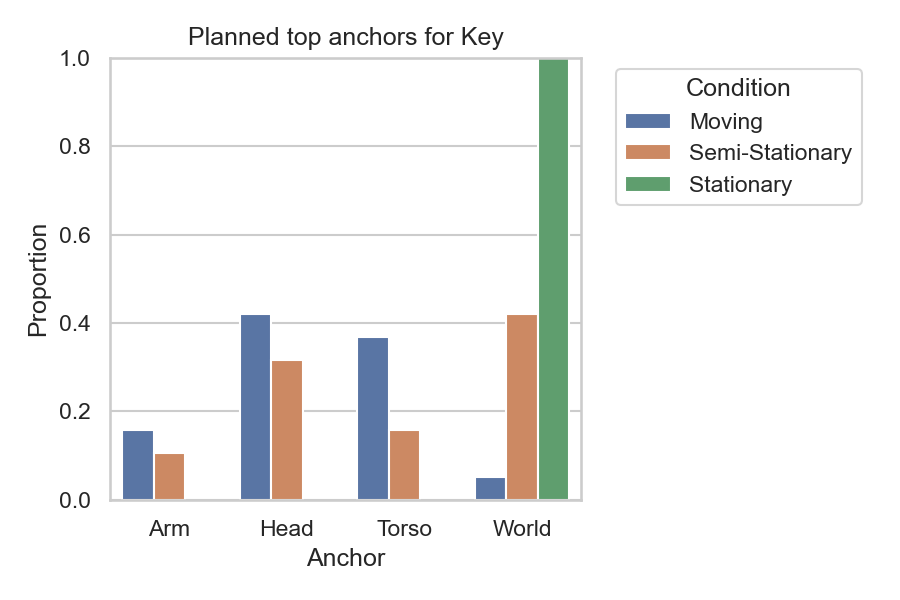

#### pref_barchart_visual.png

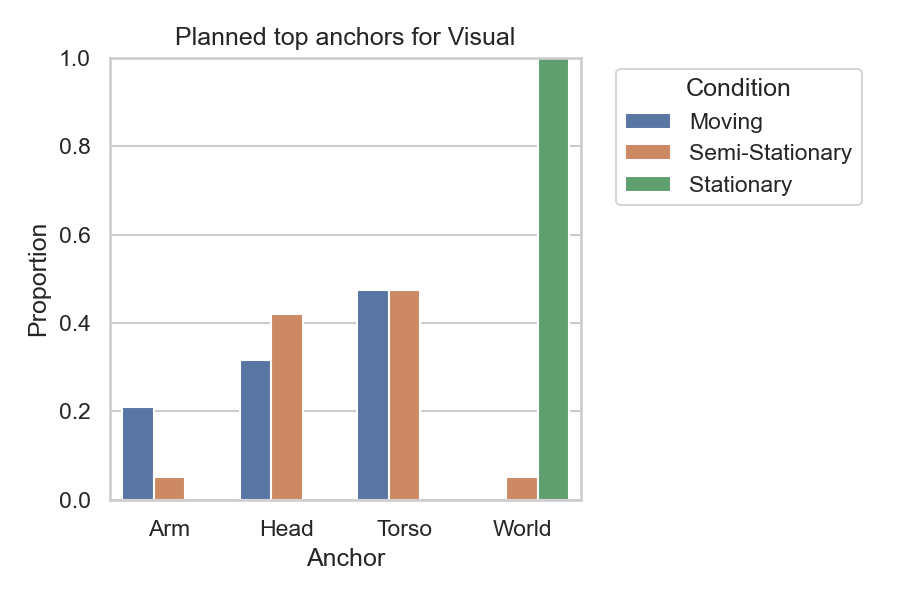

#### pref_barchart_controls.png

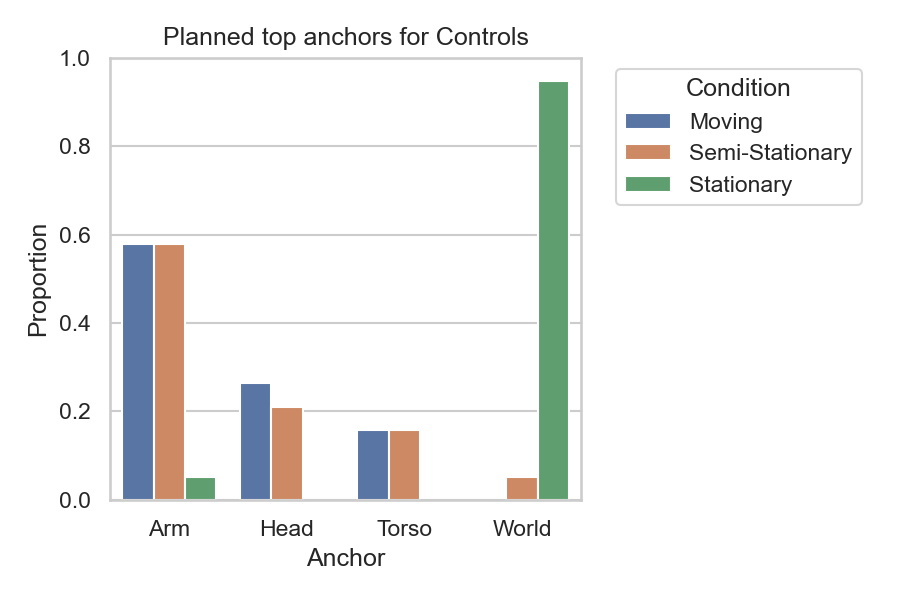

#### pref_barchart_key.png

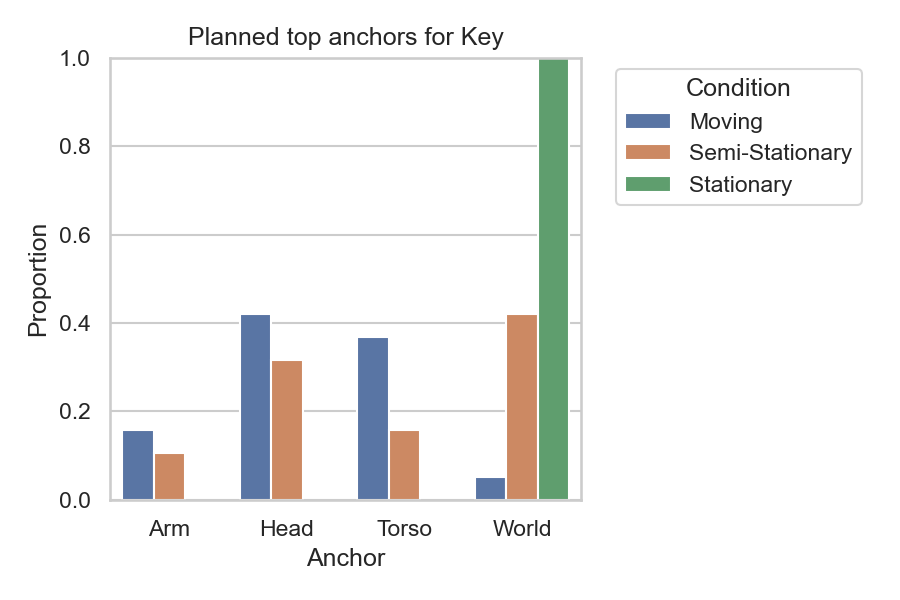

#### pref_barchart_visual.png

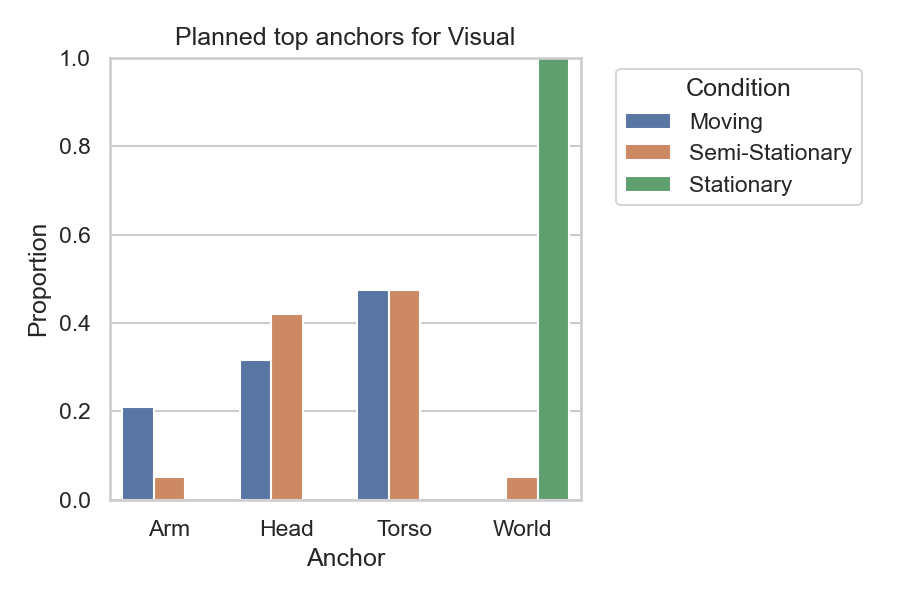

#### pref_barchart_controls.png

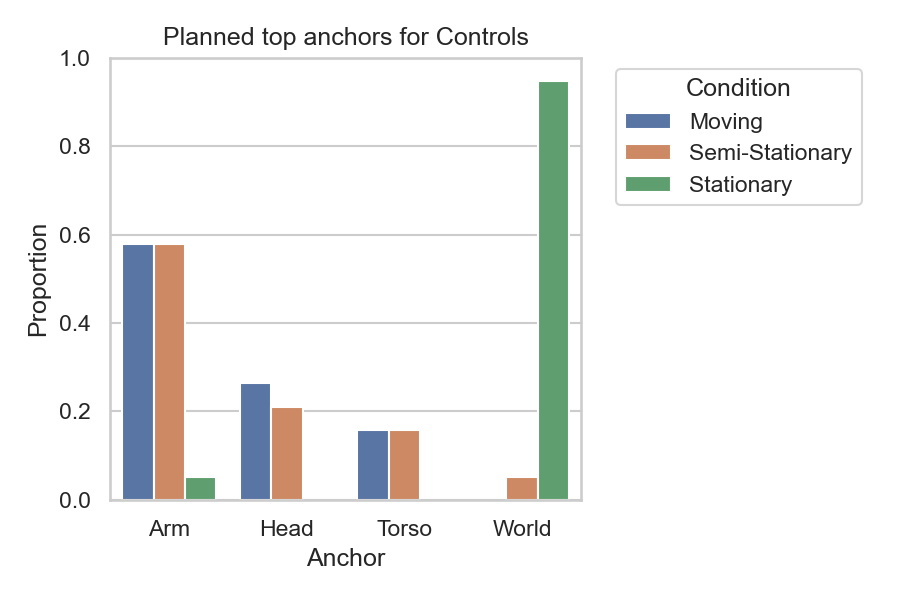

#### pref_barchart_key.png

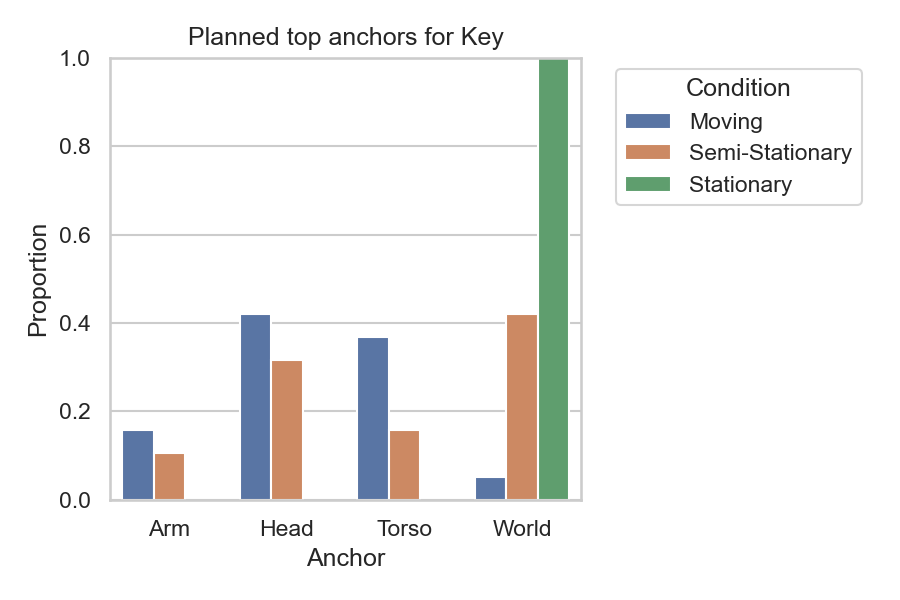

#### pref_barchart_visual.png

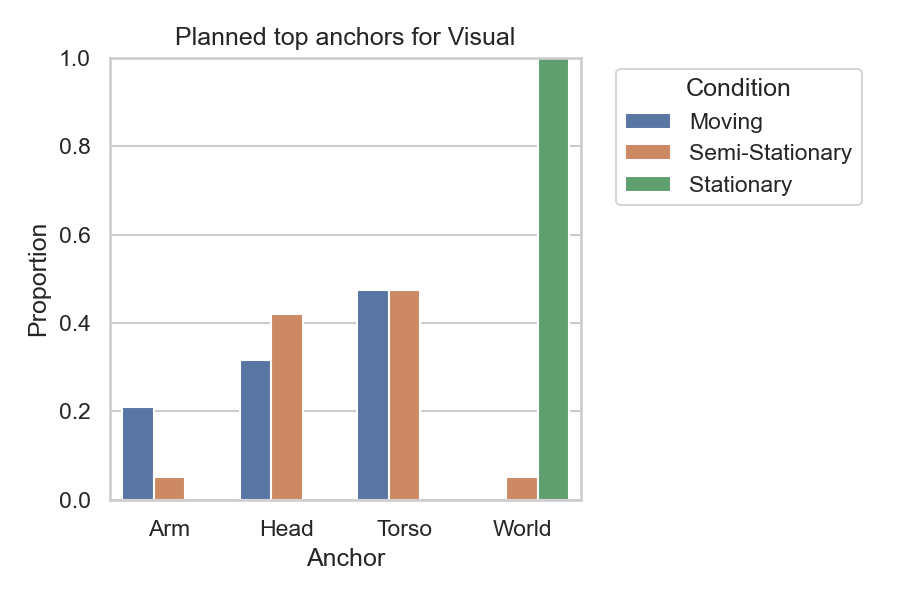

#### pref_barchart_controls.png

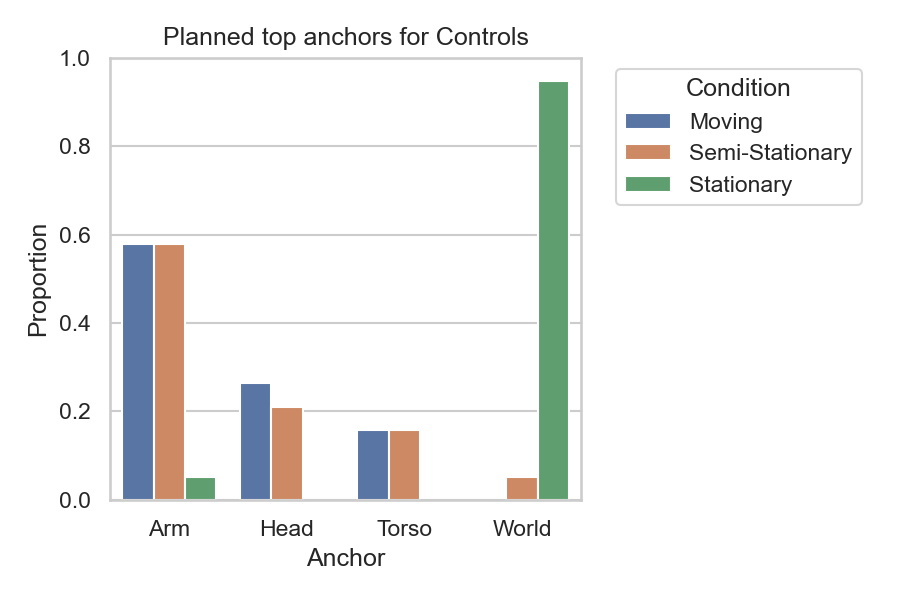

## 1.3 Repeated-measures comparisons (anchors within task, per condition)

Data: `outputs/friedman_tests.csv`

It asks: “Within this one condition and this one task, do the anchors have the same central tendency?” A small p‑value (p < .05) means at least one anchor’s ratings differ from the others.

Findings: For Key and Visual, within every motion condition the anchors are not equivalent (Friedman p ≪ .05; moderate Kendall’s W), meaning anchor choice materially changes perceived ease even after conditioning on motion. For Controls, differences are less pronounced (often non‑significant), consistent with a more tolerant interaction pattern where multiple anchors can work if the UI remains reachable.

Implication: For Key/Visual, you should pick the anchor based on the user’s motion state (e.g., Torso when Moving, World when Stationary), because it has a significant, non‑trivial impact on perceived ease.
For Controls, you have more freedom—several anchors may feel comparably usable, so choose based on secondary goals (reach time, clutter, availability), which is why Arm tends to be preferred when Moving.

## 1.4 Condition effects (between conditions per anchor)

Data: `outputs/condition_effects.csv`

Usage: What H and the tiny p-values mean: A large H with p ≪ .05 says the rating distributions for that anchor are not the same across conditions. The extremely small p for World (≈10⁻⁸–10⁻⁹) indicates a very strong condition effect: World is rated much higher when Stationary and much lower when Moving (Semi is in between). For Torso, H is also significant—ratings rise in Moving/Semi versus Stationary. For Arm, the effect appears most clearly for Controls in Moving (higher) versus Stationary (lower).

Findings: Ratings for World exhibit the largest condition effect (H p ~ 10^-8 to 10^-9), soaring in Stationary but collapsing in Moving. Torso and Arm also vary by condition (e.g., Torso better when Moving/Semi than Stationary; Arm markedly better for Controls when Moving), quantitatively confirming that stationarity is a primary driver of anchoring suitability.

A simple, robust rule emerges:
Stationary → default World (all tasks).
Moving → Torso for Key/Visual; Arm for Controls; Head for short, transient “peek” only.
Semi‑Stationary → in between: Torso for Visual; Arm competitive for Controls; Key can be Torso or nearby World depending on workstation proximity.

## 1.5 Correlations and associations

Data: `outputs/correlations_spearman.csv`, `outputs/correlations_chi_square.csv`, `outputs/multinomial_choice_model.csv`

Findings: Age, XR, and game experience do not predict overall ease meaningfully (e.g., age ρ=.21, p=.40). In contrast, planned top is strongly associated with condition (χ² p≈3.8e‑6) and not with gender, underscoring that context—not demographics—explains the bulk of anchor choice variance in this study.

## 1.6 Consistency: planned vs rated top (per condition)

Data: `outputs/consistency_agreement.csv`

What was compared: For each participant, condition (Stationary/Semi/Moving), and task (Key/Visual/Controls), we took:
1) the anchor they planned to use first (planned_top), and
2) the anchor that ended up best by their ratings (rated_top),

Findings: Agreement between planned and experienced top anchors is very high (>90% across tasks/conditions) with substantial-to‑almost‑perfect chance‑corrected agreement (κ), indicating that participants could anticipate what would work best. This stability suggests adaptive systems could safely initialize from a short planning step and require only modest runtime adaptation.

Figures:
- Planned vs rated (sankey-like):
  - `figs/sankey_planned_vs_rated.png`
- Participant radar (example and per condition):
  - `figs/radar_1.png`
  - `figs/radar_1_stationary.png`
  - `figs/radar_1_semi-stationary.png`
  - `figs/radar_1_moving.png`

#### sankey_planned_vs_rated.png

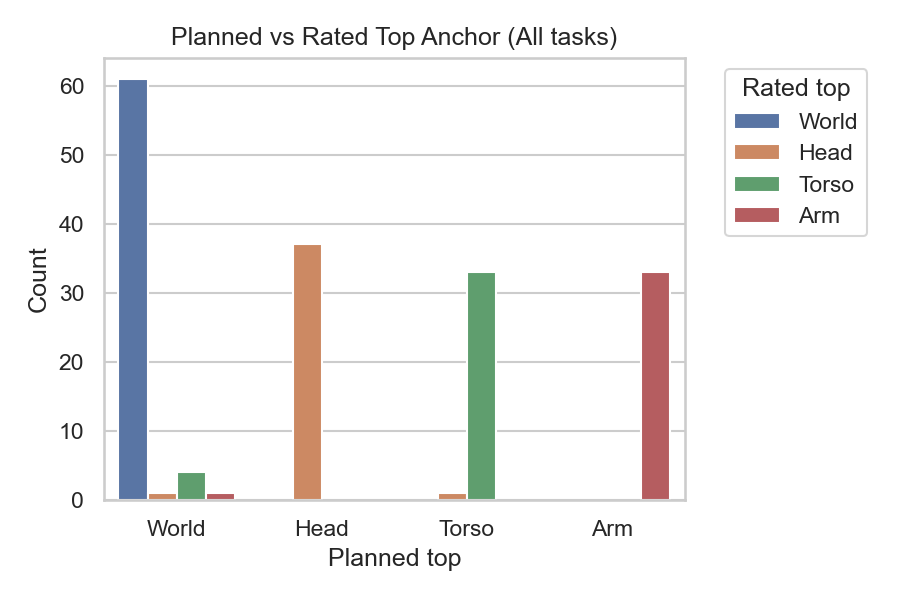

#### radar_1.png

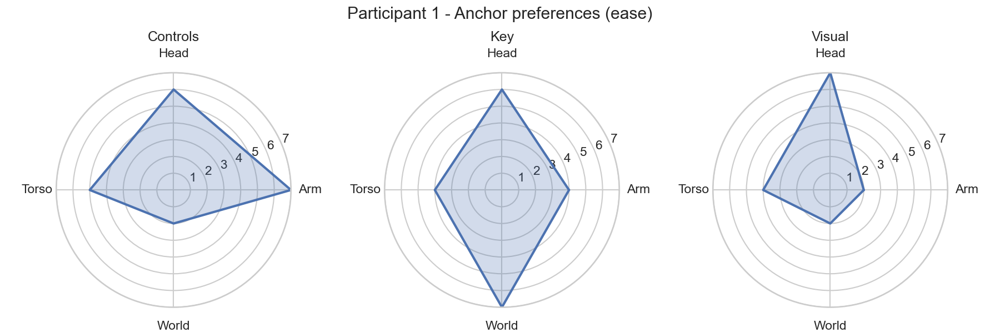

#### radar_1_stationary.png

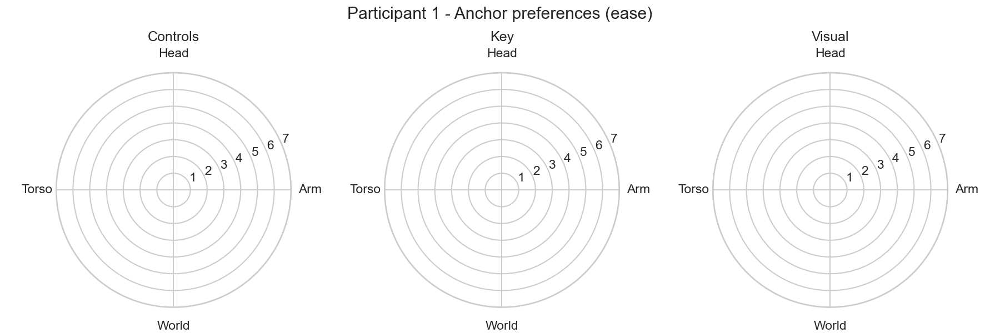

#### radar_1_semi-stationary.png

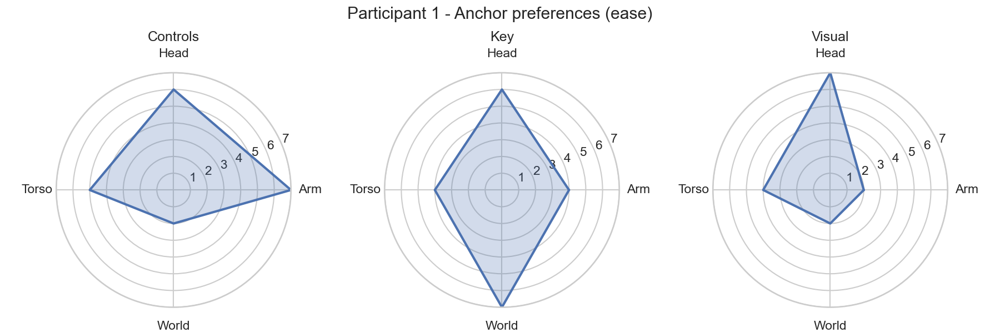

#### radar_1_moving.png

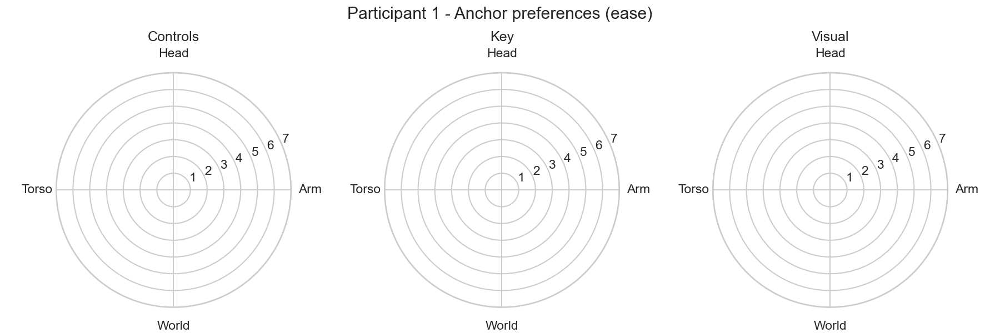

#### sankey_planned_vs_rated.png

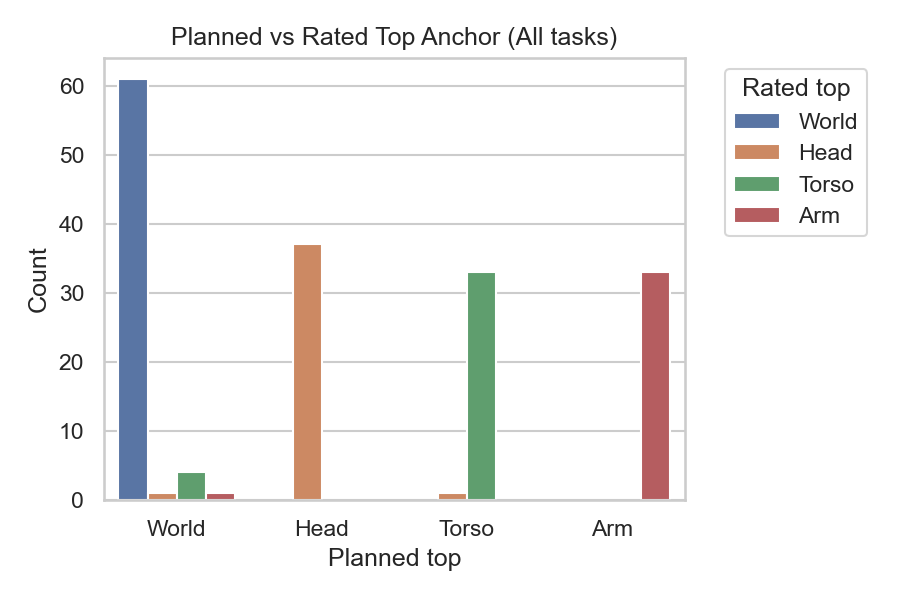

#### radar_1.png

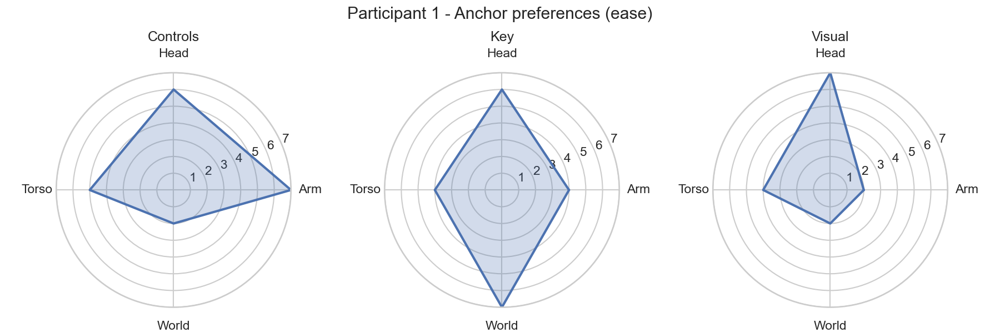

#### radar_1_stationary.png

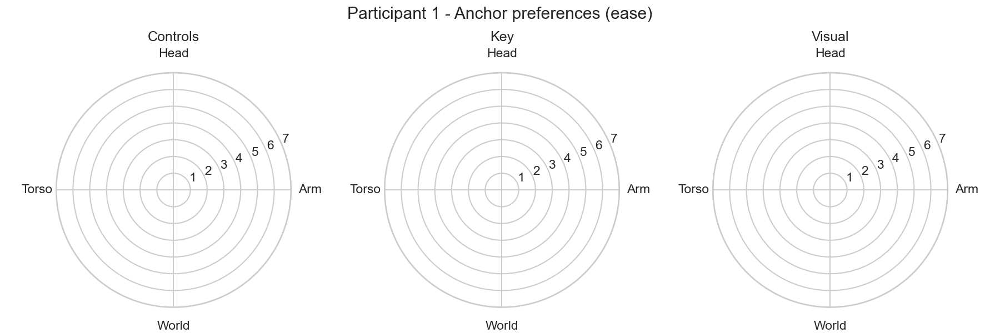

#### radar_1_semi-stationary.png

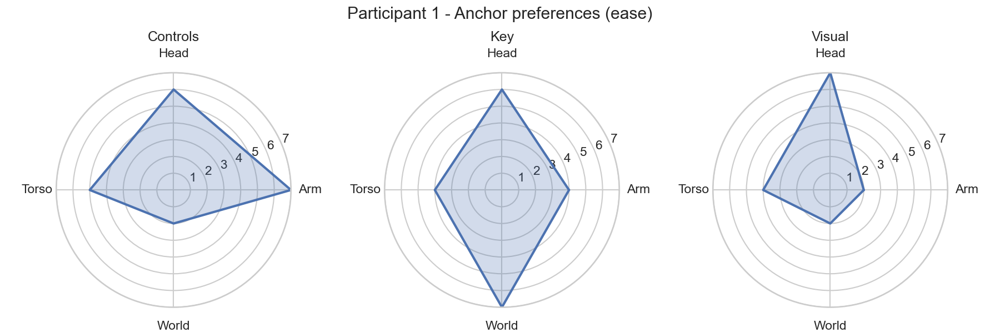

#### radar_1_moving.png

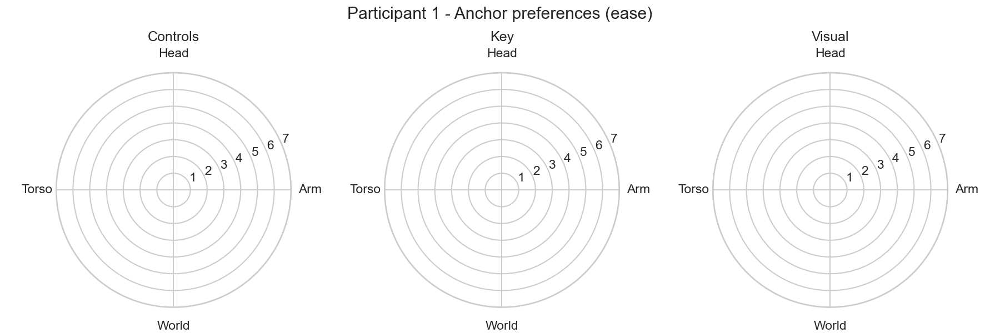

#### sankey_planned_vs_rated.png

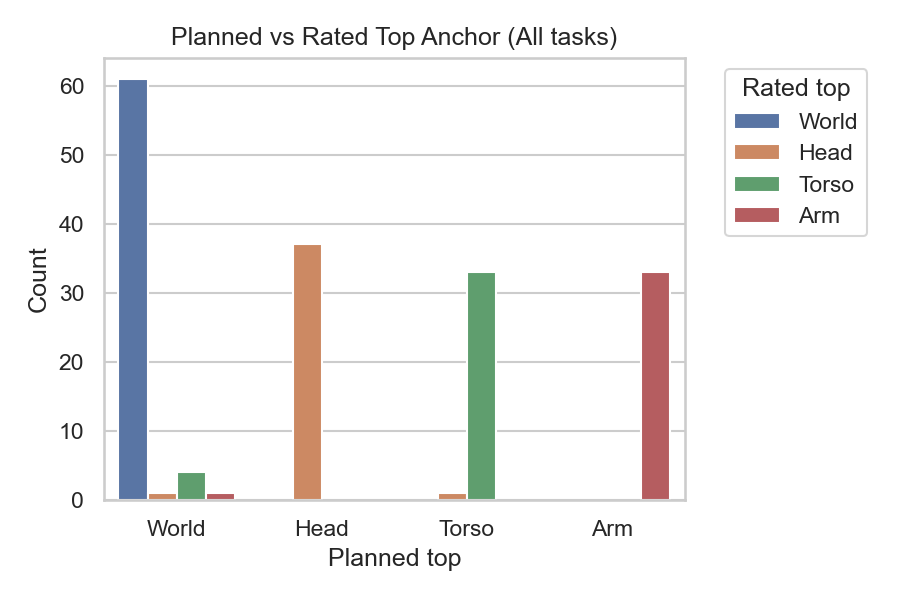

#### radar_1.png

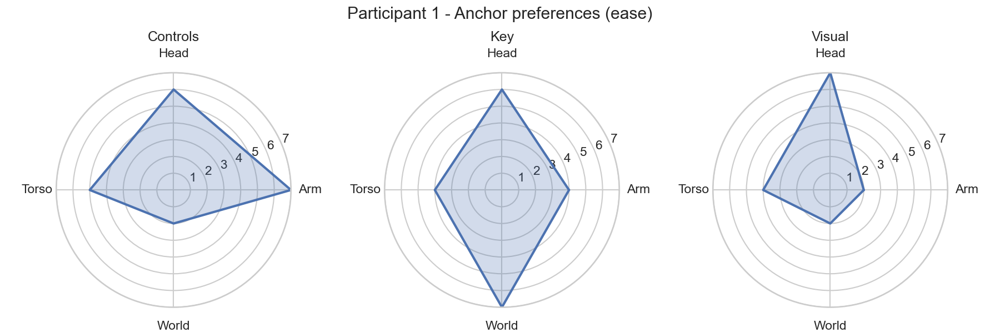

#### radar_1_stationary.png

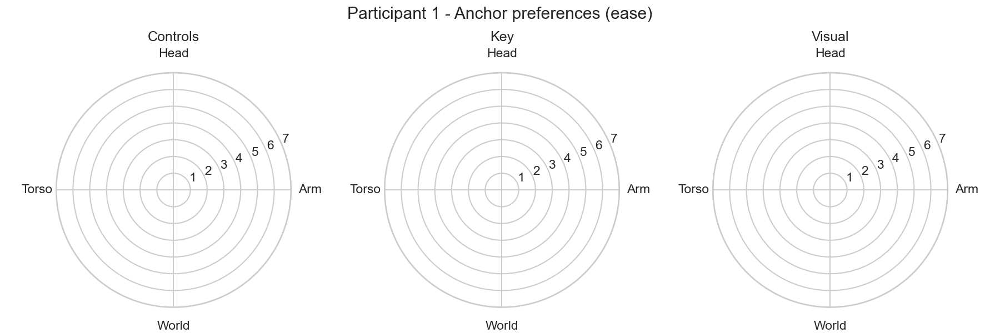

#### radar_1_semi-stationary.png

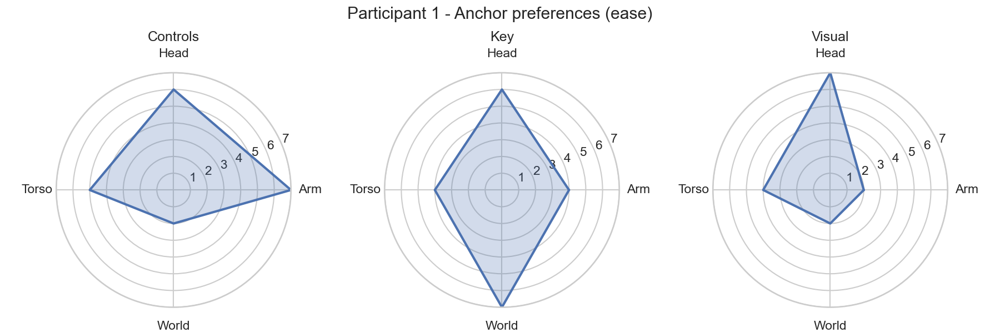

#### radar_1_moving.png

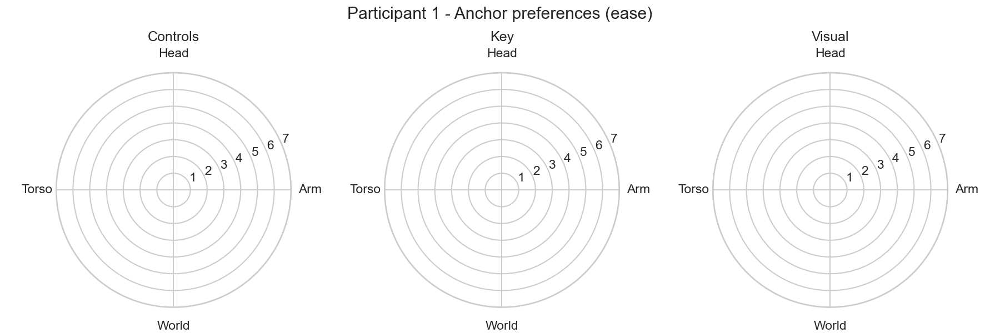

## 1.7 Planned preferences as ranks

Data: `outputs/planned_mean_ranks.csv`, `outputs/planned_friedman_ranks.csv`

Findings: Mean ranks reproduce the same ordering as ratings, and Friedman on ranks is significant for most condition×task combinations, indicating that the planning phase already captures robust ordering information that matches experience.

## 1.8 Preference Strength Index (PSI)

Data: `outputs/preference_strength_index.csv`

Findings: PSI frequently exceeds 2.0 for Stationary‑World (all tasks) and for Moving‑Torso (Key/Visual) or Moving‑Arm (Controls), indicating strong, confident top choices; small PSI occurs mainly where multiple anchors are viable (e.g., Controls in Semi‑Stationary).

## 1.9 Anchor Adaptability

Data: `outputs/anchor_adaptability.csv`, `outputs/anchor_adaptability_within_summary.csv`, `outputs/adaptability_planned_across_summary.csv`, `outputs/adaptability_rated_across_summary.csv`

Findings: Within a condition, many participants keep the same rated‑top across tasks (0–1 changes), but a non‑trivial fraction adapts (1–2 changes) consistent with “monitor vs control” needs. On average, within‑condition changes were: Stationary mean=0.21 (std=0.54), Semi‑Stationary mean=1.32 (std=0.75), Moving mean=1.16 (std=0.76). Across conditions (per task), mean changes in planned_top and rated_top were both ≈0.00 (no average switches per task across the three conditions in the aggregate summaries), indicating that most context‑driven switching is captured within each condition across tasks rather than between conditions per task in this study.

## 1.10 Post-hoc analyses (Holm-adjusted)

Usage:
- Purpose: After an overall test shows “there is some difference,” post‑hoc tests figure out which specific pairs differ; Holm correction keeps false positives in check.
- Reference: `posthoc_condition_pairwise.csv` (between conditions) and `posthoc_friedman_pairwise.csv` (within a condition). Rows with `p_holm < 0.05` mark the meaningful differences.

1) Condition effects post-hoc (pairwise U-tests)
Data: `outputs/posthoc_condition_pairwise.csv`

Findings: Stationary vs Moving shows large positive deltas for World across all tasks (Stationary≫Moving). Moving vs Stationary shows positive deltas for Torso (Key/Visual) and for Arm (Controls), confirming the direction and magnitude of context effects beyond omnibus tests.

2) Within-condition anchor post-hoc (pairwise Wilcoxon)
Data: `outputs/posthoc_friedman_pairwise.csv`

Findings:
- Stationary: World outranks Head/Torso/Arm for Key and Visual (large rank‑biserial effects).
- Moving: Torso outranks World for Key and Visual; Arm outranks World for Controls.
- Semi‑Stationary: Torso outranks World for Visual; Arm/Torso outrank World for Controls.

### posthoc_condition_pairwise.csv

,task,anchor,cond_a,cond_b,u_stat,p_raw,cliffs_delta,p_holm
0,Controls,Arm,Moving,Semi-Stationary,185.5,8.867293e-01,0.027701,8.867293e-01
1,Controls,Arm,Moving,Stationary,306.5,1.968122e-04,0.698061,5.904365e-04
2,Controls,Arm,Semi-Stationary,Stationary,280.5,2.967116e-03,0.554017,5.934233e-03
3,Controls,Head,Moving,Semi-Stationary,194.0,6.985167e-01,0.074792,6.985167e-01
4,Controls,Head,Moving,Stationary,235.0,1.089043e-01,0.301939,3.267128e-01
5,Controls,Head,Semi-Stationary,Stationary,224.5,1.931492e-01,0.243767,3.862984e-01
6,Controls,Torso,Moving,Semi-Stationary,179.0,9.758371e-01,-0.008310,9.758371e-01
7,Controls,Torso,Moving,Stationary,261.5,1.624513e-02,0.448753,3.249025e-02
8,Controls,Torso,Semi-Stationary,Stationary,270.0,7.213763e-03,0.495845,2.164129e-02
9,Controls,World,Moving,Semi-Stationary,145.0,2.843752e-01,-0.196676,2.843752e-01


### posthoc_friedman_pairwise.csv

,condition,task,anchor_a,anchor_b,w_stat,p_raw,rank_biserial,n,p_holm
0,Moving,Controls,World,Head,10.5,0.001688,-0.862745,19,0.006754
1,Moving,Controls,World,Torso,4.0,0.000224,-0.957895,19,0.001345
2,Moving,Controls,World,Arm,8.0,0.000431,-0.915789,19,0.002155
3,Moving,Controls,Head,Torso,33.0,0.210374,-0.371429,19,0.631122
4,Moving,Controls,Head,Arm,59.5,0.253413,-0.304094,19,0.631122
5,Moving,Controls,Torso,Arm,61.5,0.471702,-0.196078,19,0.631122
6,Moving,Key,World,Head,17.0,0.002691,-0.801170,19,0.013453
7,Moving,Key,World,Torso,7.0,0.000374,-0.926316,19,0.002246
8,Moving,Key,World,Arm,41.0,0.028721,-0.568421,19,0.057442
9,Moving,Key,Head,Torso,43.5,0.195990,-0.360294,19,0.195990


### posthoc_condition_pairwise.csv

,task,anchor,cond_a,cond_b,u_stat,p_raw,cliffs_delta,p_holm
0,Controls,Arm,Moving,Semi-Stationary,185.5,8.867293e-01,0.027701,8.867293e-01
1,Controls,Arm,Moving,Stationary,306.5,1.968122e-04,0.698061,5.904365e-04
2,Controls,Arm,Semi-Stationary,Stationary,280.5,2.967116e-03,0.554017,5.934233e-03
3,Controls,Head,Moving,Semi-Stationary,194.0,6.985167e-01,0.074792,6.985167e-01
4,Controls,Head,Moving,Stationary,235.0,1.089043e-01,0.301939,3.267128e-01
5,Controls,Head,Semi-Stationary,Stationary,224.5,1.931492e-01,0.243767,3.862984e-01
6,Controls,Torso,Moving,Semi-Stationary,179.0,9.758371e-01,-0.008310,9.758371e-01
7,Controls,Torso,Moving,Stationary,261.5,1.624513e-02,0.448753,3.249025e-02
8,Controls,Torso,Semi-Stationary,Stationary,270.0,7.213763e-03,0.495845,2.164129e-02
9,Controls,World,Moving,Semi-Stationary,145.0,2.843752e-01,-0.196676,2.843752e-01


### posthoc_friedman_pairwise.csv

,condition,task,anchor_a,anchor_b,w_stat,p_raw,rank_biserial,n,p_holm
0,Moving,Controls,World,Head,10.5,0.001688,-0.862745,19,0.006754
1,Moving,Controls,World,Torso,4.0,0.000224,-0.957895,19,0.001345
2,Moving,Controls,World,Arm,8.0,0.000431,-0.915789,19,0.002155
3,Moving,Controls,Head,Torso,33.0,0.210374,-0.371429,19,0.631122
4,Moving,Controls,Head,Arm,59.5,0.253413,-0.304094,19,0.631122
5,Moving,Controls,Torso,Arm,61.5,0.471702,-0.196078,19,0.631122
6,Moving,Key,World,Head,17.0,0.002691,-0.801170,19,0.013453
7,Moving,Key,World,Torso,7.0,0.000374,-0.926316,19,0.002246
8,Moving,Key,World,Arm,41.0,0.028721,-0.568421,19,0.057442
9,Moving,Key,Head,Torso,43.5,0.195990,-0.360294,19,0.195990


## 1.11 Performance vs demographics (StudyLogs timings)

Data: `outputs/logs/inter_completion_summary.csv`, `outputs/logs/ui_task_summary.csv`, joined with `Questionnaire.csv`

What we tested:
- Whether participant age, XR experience (1–7), and videogame experience (1–7) are associated with objective performance derived from StudyLogs.
- Performance metrics:
  - Mean inter-completion interval per condition (lower is faster).
  - Mean task completion duration averaged across tasks per condition (lower is faster).
- Analyses:
  - Spearman correlations per condition: `outputs/logs/performance_correlations_intervals.csv`, `outputs/logs/performance_correlations_durations.csv`
  - Group comparisons via Kruskal–Wallis on ordinal bins (Age: <=30 / 31–40 / 41+; Experience: low/mid/high): `outputs/logs/performance_group_tests_intervals.csv`, `outputs/logs/performance_group_tests_durations.csv`

Findings:
- Age shows moderate positive associations with slower timings (higher = slower), most clearly when users are stationary:
  - Inter-completion intervals and overall completion duration per condition (Spearman ρ [two‑sided p]):
  - Definitions:
    - Inter‑completion interval: mean time between consecutive TaskCompletion events per participant×condition (seconds). Lower = faster cadence between completed tasks.
    - Overall completion duration: mean of per‑task mean completion times across tasks (Key/Visual/Controls) per participant×condition (seconds). Lower = faster average task time.

  - Spearman ρ (rank correlation) size guide: |ρ|<0.1 none, 0.1–0.3 small, 0.3–0.5 moderate, >0.5 strong; the sign shows direction (positive = higher predictor → slower timing; negative = higher predictor → faster timing).
  - Bracketed values [p] are the exact two‑sided p‑values; thresholds: p<.001 very strong, p<.01 strong, p<.05 significant, .05≤p<.10 marginal (“trend”), p≥.10 not significant.

    | Condition | Inter‑completion interval | Overall completion duration |
    |---|---|---|
    | Stationary | 0.60 [0.006] | 0.55 [0.014] |
    | Semi‑Stationary | 0.48 [0.035] | 0.41 [0.077] |
    | Moving | 0.44 [0.057] | 0.42 [0.075] |

  - Interpretation: Positive ρ means “older → slower.” Values around 0.4–0.6 indicate moderate associations. Bracketed values are exact p‑values; p<.05 denotes conventional statistical significance.
- XR and videogame experience showed no reliable associations with performance timings across conditions (all p>.06).
- Kruskal–Wallis group tests on age/experience bins did not yield consistent significant differences (all p≥.14), likely due to small bin counts.

Figures:
- `outputs/logs/figs/scatter_intervals_vs_age.png`
- `outputs/logs/figs/scatter_intervals_vs_xr_experience.png`
- `outputs/logs/figs/scatter_intervals_vs_videogame_experience.png`

#### scatter_intervals_vs_age.png

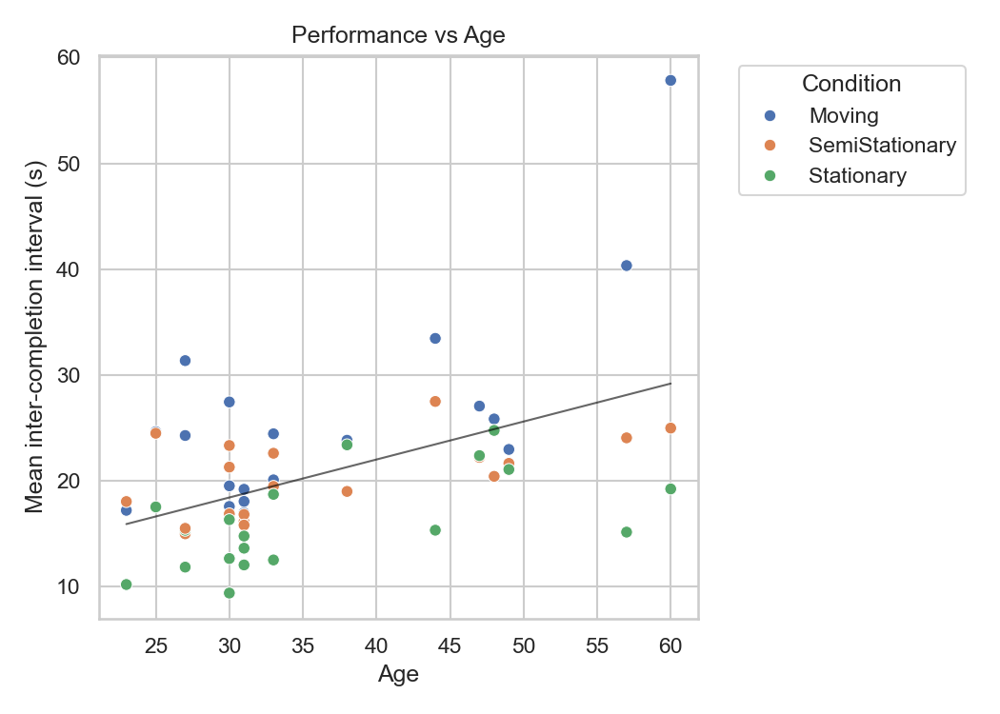

#### scatter_intervals_vs_xr_experience.png

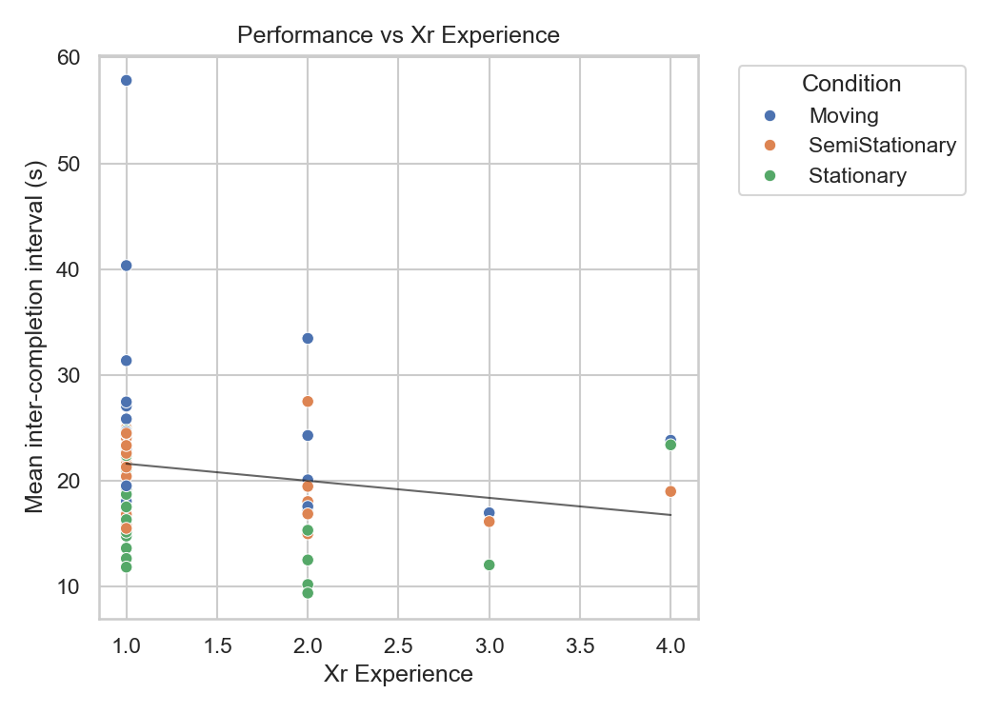

#### scatter_intervals_vs_videogame_experience.png

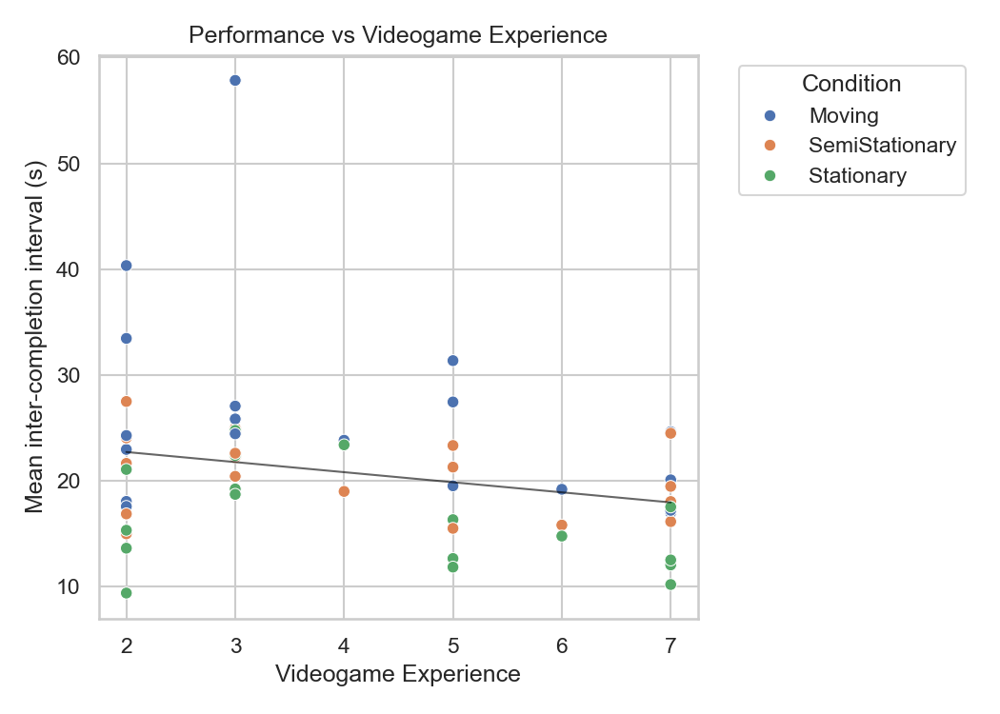

#### scatter_intervals_vs_age.png

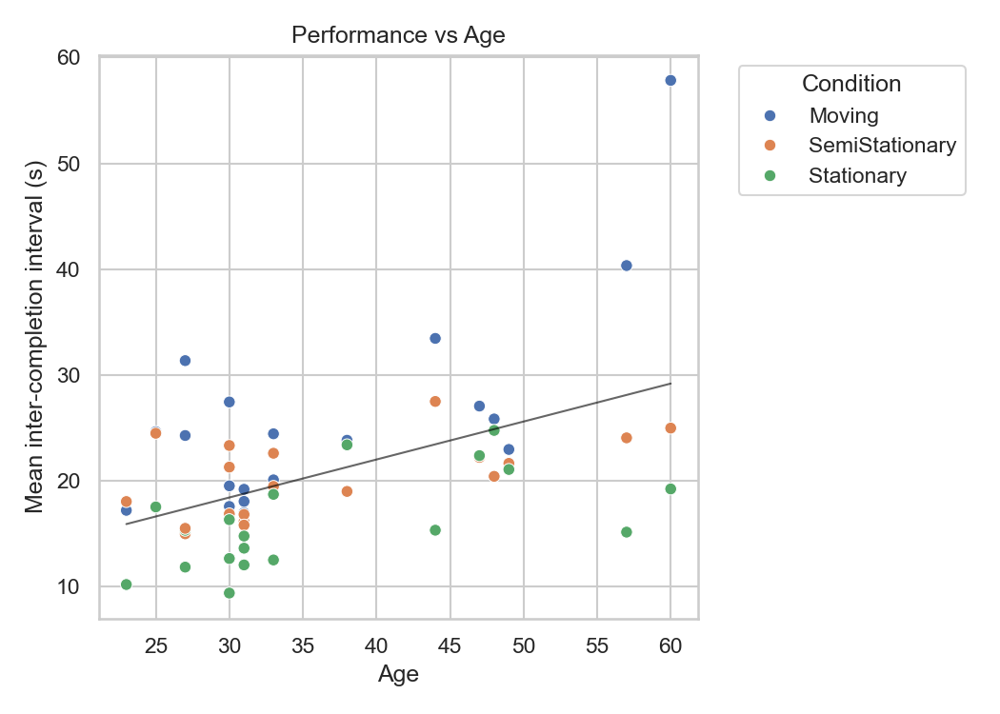

#### scatter_intervals_vs_xr_experience.png

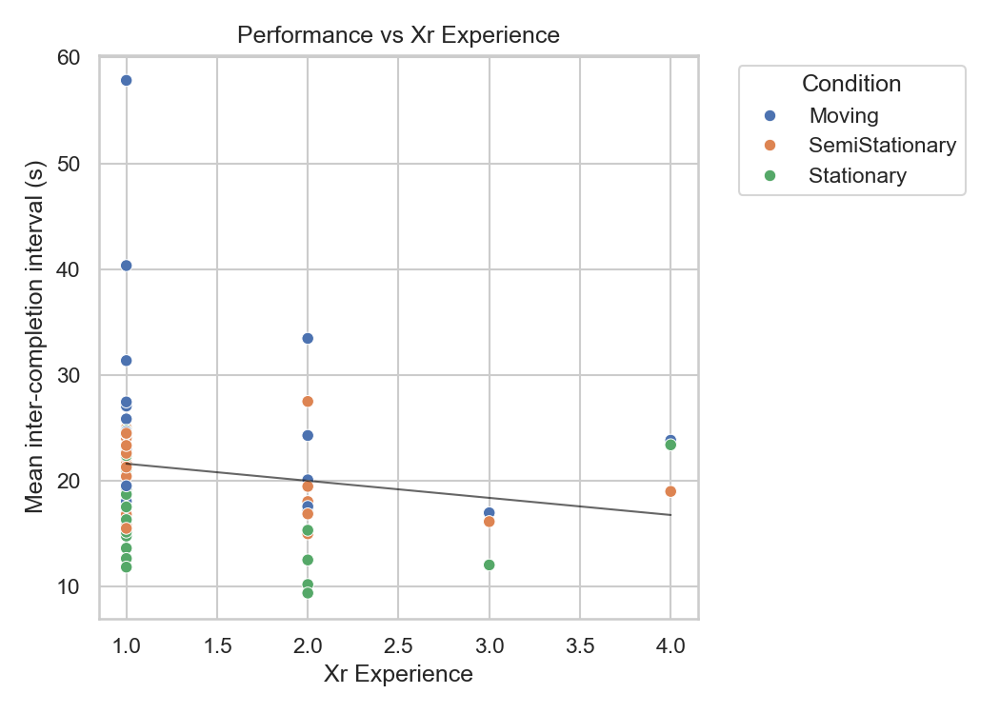

#### scatter_intervals_vs_videogame_experience.png

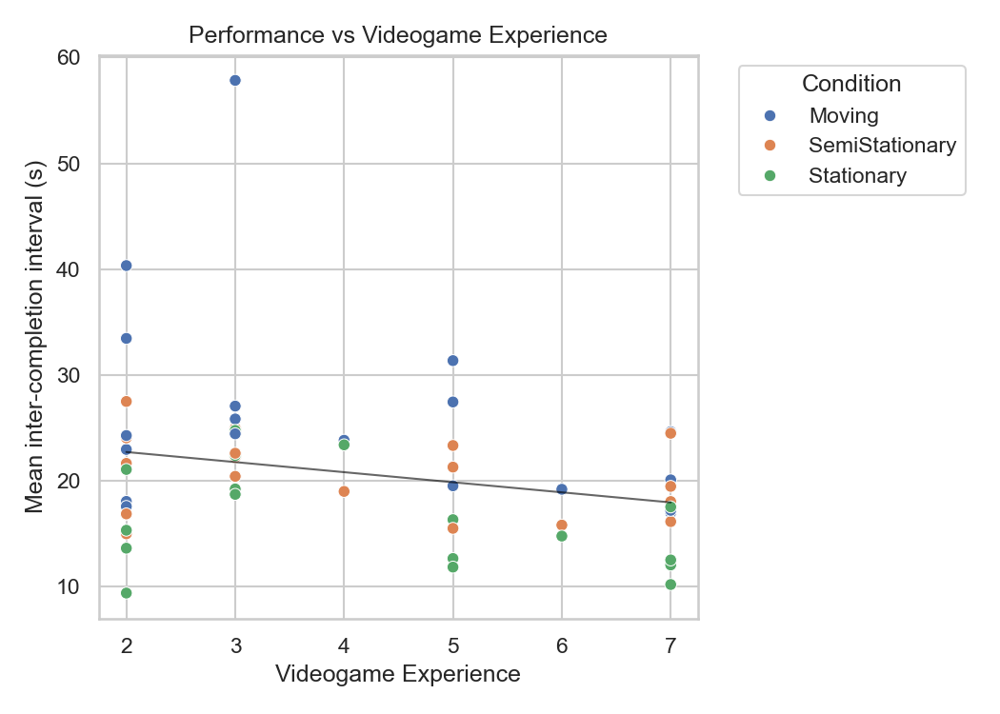

### inter_completion_summary.csv

,participant,condition,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,16.964194,17.750,9.018876,31
1,Participant_1,SemiStationary,16.132812,17.880,8.498916,32
2,Participant_1,Stationary,12.034545,12.020,8.071039,33
3,Participant_10,Moving,18.042000,16.780,8.716111,20
4,Participant_10,SemiStationary,16.807143,15.380,9.458982,21
5,Participant_10,Stationary,13.619000,14.510,6.062982,20
6,Participant_11,Moving,23.823500,19.680,17.389561,20
7,Participant_11,SemiStationary,18.985500,18.250,6.508061,20
8,Participant_11,Stationary,23.389500,23.290,11.092348,20
9,Participant_12,Moving,19.187000,15.765,12.631952,20


### ui_task_summary.csv

,participant,condition,task,num_completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Participant_1,Moving,Controls,12,6.138333,5.680,2.701575,1.000000
1,Participant_1,Moving,Key,10,22.602000,22.200,14.067989,0.800000
2,Participant_1,Moving,Visual,10,12.300000,13.115,6.377711,0.900000
3,Participant_1,SemiStationary,Controls,12,8.953333,7.910,4.580048,1.000000
4,Participant_1,SemiStationary,Key,10,38.698000,37.865,17.182977,1.000000
...,...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,7,34.130000,35.650,17.647877,0.714286
167,Participant_9,SemiStationary,Visual,7,7.624286,6.250,3.853331,0.857143
168,Participant_9,Stationary,Controls,7,7.518571,4.310,7.647175,1.000000
169,Participant_9,Stationary,Key,7,30.457143,22.790,19.177308,1.000000


### performance_correlations_intervals.csv

,condition,metric,predictor,rho,p_value,n
0,Moving,mean_interval_s,age,0.444057,0.056828,19
1,Moving,mean_interval_s,xr_experience,-0.429713,0.066329,19
2,Moving,mean_interval_s,videogame_experience,-0.298169,0.215013,19
3,SemiStationary,mean_interval_s,age,0.484586,0.035495,19
4,SemiStationary,mean_interval_s,xr_experience,-0.332284,0.164549,19
5,SemiStationary,mean_interval_s,videogame_experience,-0.146833,0.548611,19
6,Stationary,mean_interval_s,age,0.604411,0.006125,19
7,Stationary,mean_interval_s,xr_experience,-0.302543,0.208037,19
8,Stationary,mean_interval_s,videogame_experience,-0.265740,0.271499,19


### performance_correlations_durations.csv

,condition,metric,predictor,rho,p_value,n
0,Moving,mean_duration_overall_s,age,0.418506,0.074541,19
1,Moving,mean_duration_overall_s,xr_experience,-0.421509,0.072271,19
2,Moving,mean_duration_overall_s,videogame_experience,-0.245021,0.311999,19
3,SemiStationary,mean_duration_overall_s,age,0.414982,0.077273,19
4,SemiStationary,mean_duration_overall_s,xr_experience,-0.428688,0.067051,19
5,SemiStationary,mean_duration_overall_s,videogame_experience,-0.291863,0.225339,19
6,Stationary,mean_duration_overall_s,age,0.552428,0.014178,19
7,Stationary,mean_duration_overall_s,xr_experience,-0.348693,0.143435,19
8,Stationary,mean_duration_overall_s,videogame_experience,-0.212592,0.382223,19


### performance_group_tests_intervals.csv

,condition,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,mean_interval_s,age,2.000000,0.367879,1.0,3.0,3.0,NaN,NaN,NaN
1,Moving,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,7.0,0.0,0.0
2,Moving,mean_interval_s,videogame_experience,2.314286,0.314383,NaN,NaN,NaN,5.0,1.0,1.0
3,SemiStationary,mean_interval_s,age,2.142857,0.342519,4.0,1.0,1.0,NaN,NaN,NaN
4,SemiStationary,mean_interval_s,xr_experience,2.142857,0.143235,NaN,NaN,NaN,5.0,1.0,0.0
5,SemiStationary,mean_interval_s,videogame_experience,0.857143,0.651439,NaN,NaN,NaN,2.0,2.0,2.0
6,Stationary,mean_interval_s,age,0.857143,0.651439,2.0,2.0,2.0,NaN,NaN,NaN
7,Stationary,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,6.0,0.0,0.0
8,Stationary,mean_interval_s,videogame_experience,2.142857,0.342519,NaN,NaN,NaN,3.0,1.0,2.0


### performance_group_tests_durations.csv

,condition,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,mean_duration_overall_s,age,3.142857,0.207748,1.0,3.0,3.0,NaN,NaN,NaN
1,Moving,mean_duration_overall_s,xr_experience,NaN,NaN,NaN,NaN,NaN,7.0,0.0,0.0
2,Moving,mean_duration_overall_s,videogame_experience,2.828571,0.243099,NaN,NaN,NaN,5.0,1.0,1.0
3,SemiStationary,mean_duration_overall_s,age,2.500000,0.286505,4.0,1.0,1.0,NaN,NaN,NaN
4,SemiStationary,mean_duration_overall_s,xr_experience,0.771429,0.379775,NaN,NaN,NaN,5.0,1.0,0.0
5,SemiStationary,mean_duration_overall_s,videogame_experience,2.571429,0.276453,NaN,NaN,NaN,2.0,2.0,2.0
6,Stationary,mean_duration_overall_s,age,3.428571,0.180092,2.0,2.0,2.0,NaN,NaN,NaN
7,Stationary,mean_duration_overall_s,xr_experience,NaN,NaN,NaN,NaN,NaN,6.0,0.0,0.0
8,Stationary,mean_duration_overall_s,videogame_experience,1.238095,0.538457,NaN,NaN,NaN,3.0,1.0,2.0


### inter_completion_summary.csv

,participant,condition,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,16.964194,17.750,9.018876,31
1,Participant_1,SemiStationary,16.132812,17.880,8.498916,32
2,Participant_1,Stationary,12.034545,12.020,8.071039,33
3,Participant_10,Moving,18.042000,16.780,8.716111,20
4,Participant_10,SemiStationary,16.807143,15.380,9.458982,21
5,Participant_10,Stationary,13.619000,14.510,6.062982,20
6,Participant_11,Moving,23.823500,19.680,17.389561,20
7,Participant_11,SemiStationary,18.985500,18.250,6.508061,20
8,Participant_11,Stationary,23.389500,23.290,11.092348,20
9,Participant_12,Moving,19.187000,15.765,12.631952,20


### ui_task_summary.csv

,participant,condition,task,num_completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Participant_1,Moving,Controls,12,6.138333,5.680,2.701575,1.000000
1,Participant_1,Moving,Key,10,22.602000,22.200,14.067989,0.800000
2,Participant_1,Moving,Visual,10,12.300000,13.115,6.377711,0.900000
3,Participant_1,SemiStationary,Controls,12,8.953333,7.910,4.580048,1.000000
4,Participant_1,SemiStationary,Key,10,38.698000,37.865,17.182977,1.000000
...,...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,7,34.130000,35.650,17.647877,0.714286
167,Participant_9,SemiStationary,Visual,7,7.624286,6.250,3.853331,0.857143
168,Participant_9,Stationary,Controls,7,7.518571,4.310,7.647175,1.000000
169,Participant_9,Stationary,Key,7,30.457143,22.790,19.177308,1.000000


### performance_correlations_intervals.csv

,condition,metric,predictor,rho,p_value,n
0,Moving,mean_interval_s,age,0.444057,0.056828,19
1,Moving,mean_interval_s,xr_experience,-0.429713,0.066329,19
2,Moving,mean_interval_s,videogame_experience,-0.298169,0.215013,19
3,SemiStationary,mean_interval_s,age,0.484586,0.035495,19
4,SemiStationary,mean_interval_s,xr_experience,-0.332284,0.164549,19
5,SemiStationary,mean_interval_s,videogame_experience,-0.146833,0.548611,19
6,Stationary,mean_interval_s,age,0.604411,0.006125,19
7,Stationary,mean_interval_s,xr_experience,-0.302543,0.208037,19
8,Stationary,mean_interval_s,videogame_experience,-0.265740,0.271499,19


### performance_correlations_durations.csv

,condition,metric,predictor,rho,p_value,n
0,Moving,mean_duration_overall_s,age,0.418506,0.074541,19
1,Moving,mean_duration_overall_s,xr_experience,-0.421509,0.072271,19
2,Moving,mean_duration_overall_s,videogame_experience,-0.245021,0.311999,19
3,SemiStationary,mean_duration_overall_s,age,0.414982,0.077273,19
4,SemiStationary,mean_duration_overall_s,xr_experience,-0.428688,0.067051,19
5,SemiStationary,mean_duration_overall_s,videogame_experience,-0.291863,0.225339,19
6,Stationary,mean_duration_overall_s,age,0.552428,0.014178,19
7,Stationary,mean_duration_overall_s,xr_experience,-0.348693,0.143435,19
8,Stationary,mean_duration_overall_s,videogame_experience,-0.212592,0.382223,19


### performance_group_tests_intervals.csv

,condition,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,mean_interval_s,age,2.000000,0.367879,1.0,3.0,3.0,NaN,NaN,NaN
1,Moving,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,7.0,0.0,0.0
2,Moving,mean_interval_s,videogame_experience,2.314286,0.314383,NaN,NaN,NaN,5.0,1.0,1.0
3,SemiStationary,mean_interval_s,age,2.142857,0.342519,4.0,1.0,1.0,NaN,NaN,NaN
4,SemiStationary,mean_interval_s,xr_experience,2.142857,0.143235,NaN,NaN,NaN,5.0,1.0,0.0
5,SemiStationary,mean_interval_s,videogame_experience,0.857143,0.651439,NaN,NaN,NaN,2.0,2.0,2.0
6,Stationary,mean_interval_s,age,0.857143,0.651439,2.0,2.0,2.0,NaN,NaN,NaN
7,Stationary,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,6.0,0.0,0.0
8,Stationary,mean_interval_s,videogame_experience,2.142857,0.342519,NaN,NaN,NaN,3.0,1.0,2.0


### performance_group_tests_durations.csv

,condition,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,mean_duration_overall_s,age,3.142857,0.207748,1.0,3.0,3.0,NaN,NaN,NaN
1,Moving,mean_duration_overall_s,xr_experience,NaN,NaN,NaN,NaN,NaN,7.0,0.0,0.0
2,Moving,mean_duration_overall_s,videogame_experience,2.828571,0.243099,NaN,NaN,NaN,5.0,1.0,1.0
3,SemiStationary,mean_duration_overall_s,age,2.500000,0.286505,4.0,1.0,1.0,NaN,NaN,NaN
4,SemiStationary,mean_duration_overall_s,xr_experience,0.771429,0.379775,NaN,NaN,NaN,5.0,1.0,0.0
5,SemiStationary,mean_duration_overall_s,videogame_experience,2.571429,0.276453,NaN,NaN,NaN,2.0,2.0,2.0
6,Stationary,mean_duration_overall_s,age,3.428571,0.180092,2.0,2.0,2.0,NaN,NaN,NaN
7,Stationary,mean_duration_overall_s,xr_experience,NaN,NaN,NaN,NaN,NaN,6.0,0.0,0.0
8,Stationary,mean_duration_overall_s,videogame_experience,1.238095,0.538457,NaN,NaN,NaN,3.0,1.0,2.0


#### scatter_intervals_vs_age.png

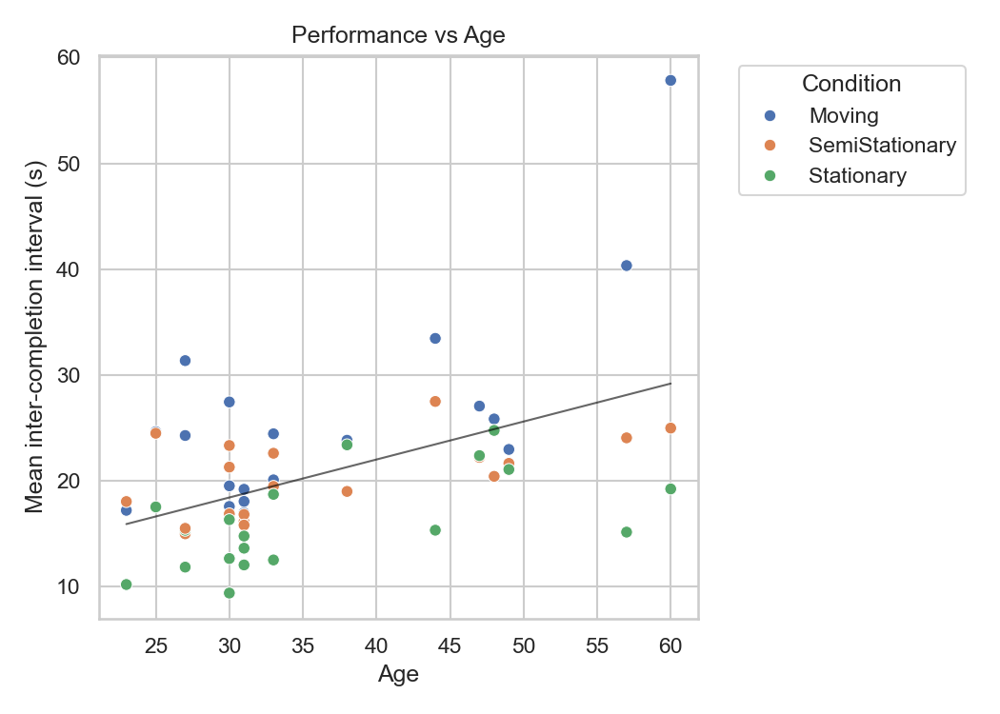

#### scatter_intervals_vs_xr_experience.png

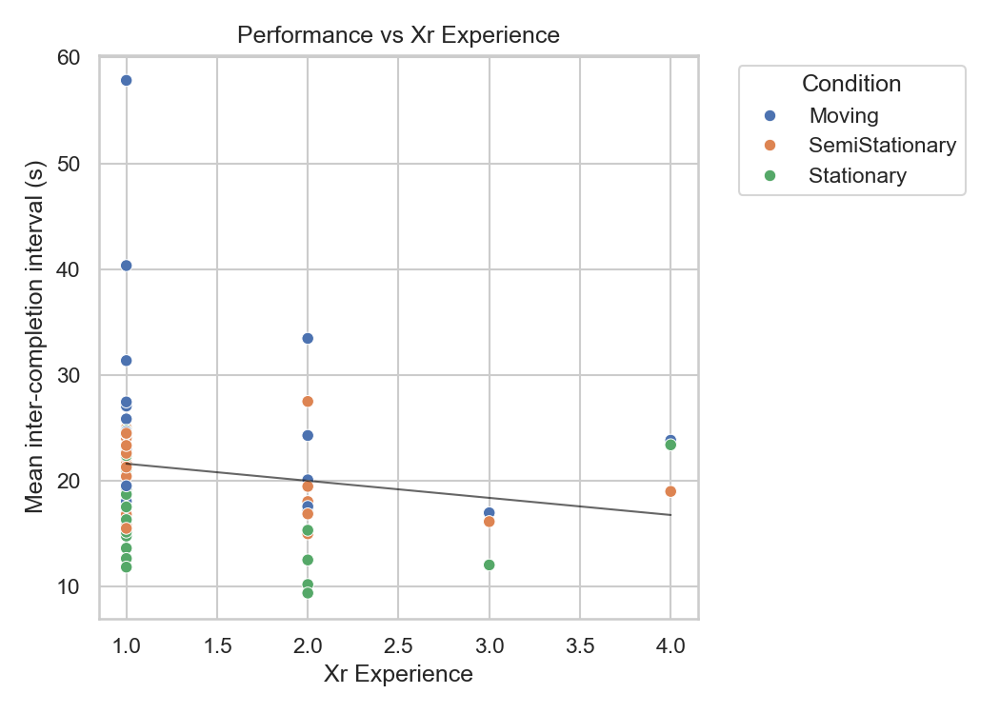

#### scatter_intervals_vs_videogame_experience.png

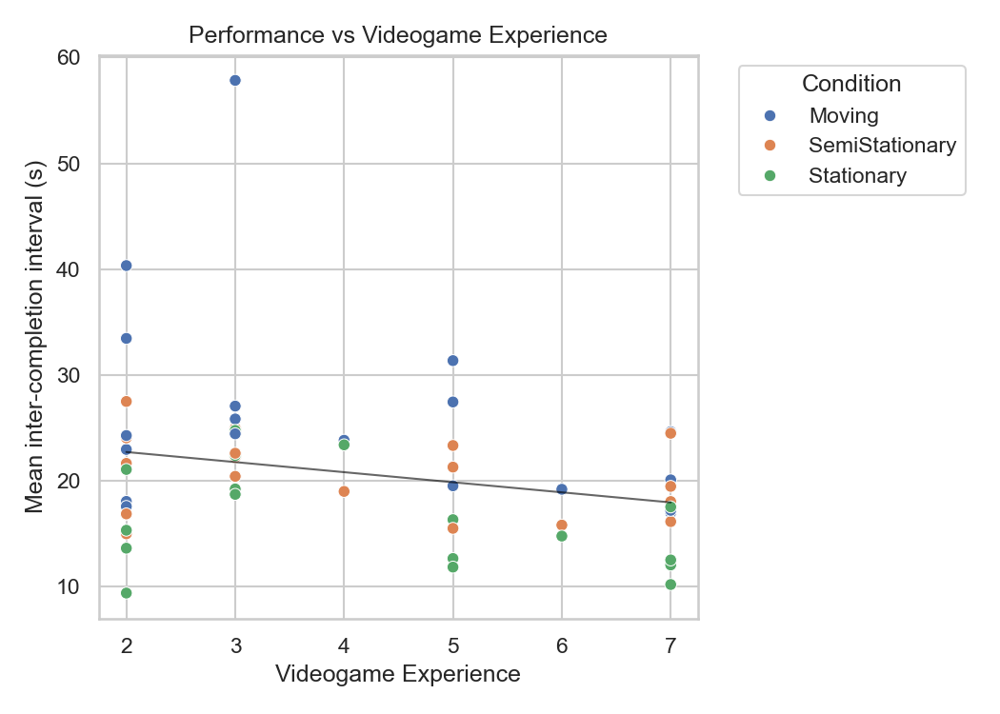

## 1.12 Task‑level performance (by task)

Data:
- Intervals by task: `outputs/logs/inter_completion_summary_by_task.csv`
- Correlations by task: `outputs/logs/performance_correlations_intervals_by_task.csv`, `outputs/logs/performance_correlations_durations_by_task.csv`
- Group tests by task: `outputs/logs/performance_group_tests_intervals_by_task.csv`, `outputs/logs/performance_group_tests_durations_by_task.csv`

Findings:
- Inter‑completion intervals (lower = faster cadence):
  - Stationary: Age shows strong positive associations (ρ [p]) — Key 0.71 [0.00066], Visual 0.59 [0.0077], Controls 0.47 [0.043].
  - Moving: Age correlates moderately for Key 0.49 [0.033] and Visual 0.47 [0.045]; Controls weaker and non‑significant.
  - Semi‑Stationary: Visual shows a moderate association (0.49 [0.032]); other tasks non‑significant.
- Completion duration (lower = faster per‑task time):
  - Visual shows the clearest age effects — Stationary 0.734 [0.00035], Semi‑Stationary 0.709 [0.00067]; Moving shows a trend 0.409 [0.082].
  - Videogame experience shows task‑specific negative associations for Visual duration (faster with more experience): Semi‑Stationary −0.495 [0.031], Stationary −0.479 [0.038]. Other tasks did not show reliable effects for XR/videogame experience.

Note: Bracketed values are exact two‑sided p; interpretation guides for ρ and p are in §1.11.

Brief interpretation:
- Visual shows the most consistent age effect on speed (both cadence and duration), especially when not moving; Key shows moderate age effects; Controls show weak/none.
- Where ρ is positive and significant, older participants tend to be slower on that metric; negative ρ indicates faster with higher predictor (seen only weakly for Controls).

### inter_completion_summary_by_task.csv

,participant,condition,task,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,Controls,47.132727,57.420,23.183902,11
1,Participant_1,Moving,Key,53.800000,54.190,11.432894,9
2,Participant_1,Moving,Visual,52.322222,51.430,14.346571,9
3,Participant_1,SemiStationary,Controls,41.830000,42.230,17.828748,11
4,Participant_1,SemiStationary,Key,52.667778,52.800,24.143568,9
...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,47.135000,44.005,18.046623,6
167,Participant_9,SemiStationary,Visual,49.900000,48.395,21.614736,6
168,Participant_9,Stationary,Controls,39.435000,36.950,19.853195,6
169,Participant_9,Stationary,Key,37.766667,39.005,11.525535,6


### performance_correlations_intervals_by_task.csv

,condition,task,metric,predictor,rho,p_value,n
0,Moving,Controls,mean_interval_s,age,0.403528,0.086664,19
1,Moving,Controls,mean_interval_s,xr_experience,-0.397920,0.091556,19
2,Moving,Controls,mean_interval_s,videogame_experience,-0.269343,0.264807,19
3,Moving,Key,mean_interval_s,age,0.491635,0.032526,19
4,Moving,Key,mean_interval_s,xr_experience,-0.312798,0.192266,19
5,Moving,Key,mean_interval_s,videogame_experience,-0.339607,0.154880,19
6,Moving,Visual,mean_interval_s,age,0.465203,0.044745,19
7,Moving,Visual,mean_interval_s,xr_experience,-0.347668,0.144697,19
8,Moving,Visual,mean_interval_s,videogame_experience,-0.293665,0.222357,19
9,SemiStationary,Controls,mean_interval_s,age,0.348021,0.144261,19


### performance_correlations_durations_by_task.csv

,condition,task,metric,predictor,rho,p_value,n
0,Moving,Controls,mean_duration_s,age,-0.051102,0.835416,19
1,Moving,Controls,mean_duration_s,xr_experience,-0.374332,0.114349,19
2,Moving,Controls,mean_duration_s,videogame_experience,0.065759,0.789109,19
3,Moving,Key,mean_duration_s,age,0.371810,0.117007,19
4,Moving,Key,mean_duration_s,xr_experience,-0.326131,0.172988,19
5,Moving,Key,mean_duration_s,videogame_experience,-0.202683,0.405304,19
6,Moving,Visual,mean_duration_s,age,0.408815,0.082231,19
7,Moving,Visual,mean_duration_s,xr_experience,-0.165116,0.499342,19
8,Moving,Visual,mean_duration_s,videogame_experience,-0.178361,0.465044,19
9,SemiStationary,Controls,mean_duration_s,age,-0.042291,0.863513,19


### performance_group_tests_intervals_by_task.csv

,condition,task,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,Controls,mean_interval_s,age,NaN,NaN,0.0,2.0,1.0,NaN,NaN,NaN
1,Moving,Controls,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0
2,Moving,Controls,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,1.0
3,Moving,Key,mean_interval_s,age,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN
4,Moving,Key,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
5,Moving,Key,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
6,Moving,Visual,mean_interval_s,age,NaN,NaN,0.0,2.0,0.0,NaN,NaN,NaN
7,Moving,Visual,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0
8,Moving,Visual,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0
9,SemiStationary,Controls,mean_interval_s,age,NaN,NaN,0.0,1.0,1.0,NaN,NaN,NaN


### performance_group_tests_durations_by_task.csv

,condition,task,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,Controls,mean_duration_s,age,NaN,NaN,0.0,2.0,1.0,NaN,NaN,NaN
1,Moving,Controls,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0
2,Moving,Controls,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,1.0
3,Moving,Key,mean_duration_s,age,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN
4,Moving,Key,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
5,Moving,Key,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
6,Moving,Visual,mean_duration_s,age,NaN,NaN,0.0,2.0,0.0,NaN,NaN,NaN
7,Moving,Visual,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0
8,Moving,Visual,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0
9,SemiStationary,Controls,mean_duration_s,age,NaN,NaN,0.0,1.0,1.0,NaN,NaN,NaN


### inter_completion_summary_by_task.csv

,participant,condition,task,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,Controls,47.132727,57.420,23.183902,11
1,Participant_1,Moving,Key,53.800000,54.190,11.432894,9
2,Participant_1,Moving,Visual,52.322222,51.430,14.346571,9
3,Participant_1,SemiStationary,Controls,41.830000,42.230,17.828748,11
4,Participant_1,SemiStationary,Key,52.667778,52.800,24.143568,9
...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,47.135000,44.005,18.046623,6
167,Participant_9,SemiStationary,Visual,49.900000,48.395,21.614736,6
168,Participant_9,Stationary,Controls,39.435000,36.950,19.853195,6
169,Participant_9,Stationary,Key,37.766667,39.005,11.525535,6


### performance_correlations_intervals_by_task.csv

,condition,task,metric,predictor,rho,p_value,n
0,Moving,Controls,mean_interval_s,age,0.403528,0.086664,19
1,Moving,Controls,mean_interval_s,xr_experience,-0.397920,0.091556,19
2,Moving,Controls,mean_interval_s,videogame_experience,-0.269343,0.264807,19
3,Moving,Key,mean_interval_s,age,0.491635,0.032526,19
4,Moving,Key,mean_interval_s,xr_experience,-0.312798,0.192266,19
5,Moving,Key,mean_interval_s,videogame_experience,-0.339607,0.154880,19
6,Moving,Visual,mean_interval_s,age,0.465203,0.044745,19
7,Moving,Visual,mean_interval_s,xr_experience,-0.347668,0.144697,19
8,Moving,Visual,mean_interval_s,videogame_experience,-0.293665,0.222357,19
9,SemiStationary,Controls,mean_interval_s,age,0.348021,0.144261,19


### performance_correlations_durations_by_task.csv

,condition,task,metric,predictor,rho,p_value,n
0,Moving,Controls,mean_duration_s,age,-0.051102,0.835416,19
1,Moving,Controls,mean_duration_s,xr_experience,-0.374332,0.114349,19
2,Moving,Controls,mean_duration_s,videogame_experience,0.065759,0.789109,19
3,Moving,Key,mean_duration_s,age,0.371810,0.117007,19
4,Moving,Key,mean_duration_s,xr_experience,-0.326131,0.172988,19
5,Moving,Key,mean_duration_s,videogame_experience,-0.202683,0.405304,19
6,Moving,Visual,mean_duration_s,age,0.408815,0.082231,19
7,Moving,Visual,mean_duration_s,xr_experience,-0.165116,0.499342,19
8,Moving,Visual,mean_duration_s,videogame_experience,-0.178361,0.465044,19
9,SemiStationary,Controls,mean_duration_s,age,-0.042291,0.863513,19


### performance_group_tests_intervals_by_task.csv

,condition,task,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,Controls,mean_interval_s,age,NaN,NaN,0.0,2.0,1.0,NaN,NaN,NaN
1,Moving,Controls,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0
2,Moving,Controls,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,1.0
3,Moving,Key,mean_interval_s,age,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN
4,Moving,Key,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
5,Moving,Key,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
6,Moving,Visual,mean_interval_s,age,NaN,NaN,0.0,2.0,0.0,NaN,NaN,NaN
7,Moving,Visual,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0
8,Moving,Visual,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0
9,SemiStationary,Controls,mean_interval_s,age,NaN,NaN,0.0,1.0,1.0,NaN,NaN,NaN


### performance_group_tests_durations_by_task.csv

,condition,task,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,Controls,mean_duration_s,age,NaN,NaN,0.0,2.0,1.0,NaN,NaN,NaN
1,Moving,Controls,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0
2,Moving,Controls,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,1.0
3,Moving,Key,mean_duration_s,age,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN
4,Moving,Key,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
5,Moving,Key,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
6,Moving,Visual,mean_duration_s,age,NaN,NaN,0.0,2.0,0.0,NaN,NaN,NaN
7,Moving,Visual,mean_duration_s,xr_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0
8,Moving,Visual,mean_duration_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0
9,SemiStationary,Controls,mean_duration_s,age,NaN,NaN,0.0,1.0,1.0,NaN,NaN,NaN


### inter_completion_summary_by_task.csv

,participant,condition,task,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,Controls,47.132727,57.420,23.183902,11
1,Participant_1,Moving,Key,53.800000,54.190,11.432894,9
2,Participant_1,Moving,Visual,52.322222,51.430,14.346571,9
3,Participant_1,SemiStationary,Controls,41.830000,42.230,17.828748,11
4,Participant_1,SemiStationary,Key,52.667778,52.800,24.143568,9
...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,47.135000,44.005,18.046623,6
167,Participant_9,SemiStationary,Visual,49.900000,48.395,21.614736,6
168,Participant_9,Stationary,Controls,39.435000,36.950,19.853195,6
169,Participant_9,Stationary,Key,37.766667,39.005,11.525535,6


### performance_correlations_intervals_by_task.csv

,condition,task,metric,predictor,rho,p_value,n
0,Moving,Controls,mean_interval_s,age,0.403528,0.086664,19
1,Moving,Controls,mean_interval_s,xr_experience,-0.397920,0.091556,19
2,Moving,Controls,mean_interval_s,videogame_experience,-0.269343,0.264807,19
3,Moving,Key,mean_interval_s,age,0.491635,0.032526,19
4,Moving,Key,mean_interval_s,xr_experience,-0.312798,0.192266,19
5,Moving,Key,mean_interval_s,videogame_experience,-0.339607,0.154880,19
6,Moving,Visual,mean_interval_s,age,0.465203,0.044745,19
7,Moving,Visual,mean_interval_s,xr_experience,-0.347668,0.144697,19
8,Moving,Visual,mean_interval_s,videogame_experience,-0.293665,0.222357,19
9,SemiStationary,Controls,mean_interval_s,age,0.348021,0.144261,19


### performance_group_tests_intervals_by_task.csv

,condition,task,metric,predictor,H,p_value,n_<=30,n_31-40,n_41+,n_low (1-3),n_mid (4-5),n_high (6-7)
0,Moving,Controls,mean_interval_s,age,NaN,NaN,0.0,2.0,1.0,NaN,NaN,NaN
1,Moving,Controls,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0
2,Moving,Controls,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,1.0
3,Moving,Key,mean_interval_s,age,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN
4,Moving,Key,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
5,Moving,Key,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0
6,Moving,Visual,mean_interval_s,age,NaN,NaN,0.0,2.0,0.0,NaN,NaN,NaN
7,Moving,Visual,mean_interval_s,xr_experience,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0
8,Moving,Visual,mean_interval_s,videogame_experience,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0
9,SemiStationary,Controls,mean_interval_s,age,NaN,NaN,0.0,1.0,1.0,NaN,NaN,NaN


## 1.13 Performance by anchoring mode and task (StudyLogs timings)

Data: `outputs/logs/ui_task_summary_by_anchor_overall.csv`

- The table reports mean completion time (seconds; lower = faster) aggregated across participants for each condition×task×anchor, derived from TaskCompletion durations in StudyLogs.
- Anchors are canonicalized to World, Head, Torso, Arm.

#### Stationary
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | 32.95 |  | 32.31 |  |
| Visual | 10.18 |  |  |  |
| Controls | 5.02 | 2.91 |  | 4.93 |

#### Semi‑Stationary
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | 44.83 | 43.43 | 48.35 | 45.30 |
| Visual | 8.24 | 10.07 | 9.32 | 9.99 |
| Controls | 7.66 | 4.45 | 6.04 | 6.51 |

#### Moving
| Task | World | Head | Torso | Arm |
|---|---|---|---|---|
| Key | 70.57 | 58.41 | 54.57 | 62.89 |
| Visual |  | 9.84 | 11.02 | 11.30 |
| Controls |  | 5.45 | 6.40 | 8.07 |

Implications:
- Stationary: World is the practical default across tasks; even Controls are near‑fastest in World (≈5.0 s), with Head slightly faster when used.
- Semi‑Stationary: Head often yields the fastest Controls (≈4.45 s) and competitive Key; Visual favors World/Torso (≈8.2–9.3 s). Body anchors (Torso/Arm) remain viable without clear penalties.
- Moving: For Controls, Head is fastest (≈5.45 s), with Torso close; Arm remains usable but slower on average. For Key/Visual, Torso/Head are faster than World, matching users’ stated preferences.

### ui_task_summary_by_anchor_overall.csv

,condition,task,anchor,participants,completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Moving,Controls,Arm,12,81,8.070754,6.038750,6.225317,1.000000
1,Moving,Controls,Head,6,33,5.449355,4.197500,4.122687,1.000000
2,Moving,Controls,Torso,3,28,6.400714,5.630000,4.549780,1.000000
3,Moving,Key,Arm,3,20,62.891032,58.193333,25.857508,0.952381
4,Moving,Key,Head,8,59,58.413107,50.281250,25.860336,0.867857
5,Moving,Key,Torso,7,49,54.570000,49.870000,26.329559,0.959184
6,Moving,Key,World,1,7,70.571429,65.870000,31.909277,1.000000
7,Moving,Visual,Arm,4,28,11.299286,10.575000,6.746860,0.892857
8,Moving,Visual,Head,6,45,9.842381,9.939167,4.554306,0.935714
9,Moving,Visual,Torso,9,63,11.023651,10.386667,5.561819,0.920635


### ui_task_summary_by_anchor_overall.csv

,condition,task,anchor,participants,completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Moving,Controls,Arm,12,81,8.070754,6.038750,6.225317,1.000000
1,Moving,Controls,Head,6,33,5.449355,4.197500,4.122687,1.000000
2,Moving,Controls,Torso,3,28,6.400714,5.630000,4.549780,1.000000
3,Moving,Key,Arm,3,20,62.891032,58.193333,25.857508,0.952381
4,Moving,Key,Head,8,59,58.413107,50.281250,25.860336,0.867857
5,Moving,Key,Torso,7,49,54.570000,49.870000,26.329559,0.959184
6,Moving,Key,World,1,7,70.571429,65.870000,31.909277,1.000000
7,Moving,Visual,Arm,4,28,11.299286,10.575000,6.746860,0.892857
8,Moving,Visual,Head,6,45,9.842381,9.939167,4.554306,0.935714
9,Moving,Visual,Torso,9,63,11.023651,10.386667,5.561819,0.920635


## 2) Qualitative results and interpretation

## 2.1 Theme prevalence (mentions per participant)

Data: `outputs/triangulation_theme_prevalence.csv`

Findings: Moving participants mention visibility and stability about 2× per person on average (visibility≈2.21; stability≈2.21), far more than stationary participants (≈0.79 and 1.00). Interaction convenience remains consistently referenced, but rises in motion. Qualitatively, users care most about seeing the UI without pursuing it and about the UI not drifting while they move—explaining the torso/head bias for monitoring and the arm bias for quick actions.

## 2.2 TF‑IDF terms by condition

Data: `outputs/condition_tfidf.csv`

Findings: Moving/Semi emphasize body‑centric, gaze‑centric terms (“arm”, “head”, “hand”, “follow”, “fov”), whereas Stationary emphasizes “world”, “visual”, “controls”, “stay”—precisely matching the numeric patterns and validating the construct validity of our measures.

## 2.3 Representative quotes

Data: `outputs/representative_quotes.csv`

Findings: Quotes repeatedly highlight avoiding FoV clutter (downweighting head while moving), exploiting the hand for immediacy (arm for Controls), and using the body to keep content near yet non‑intrusive (torso for Visual/Key). Multiple participants explicitly describe “world for stationary” and “body for moving,” aligning text with statistics.

Figures:
- Word clouds by condition:
  - `figs/wordcloud_stationary.png`
  - `figs/wordcloud_semi-stationary.png`
  - `figs/wordcloud_moving.png`

#### wordcloud_stationary.png

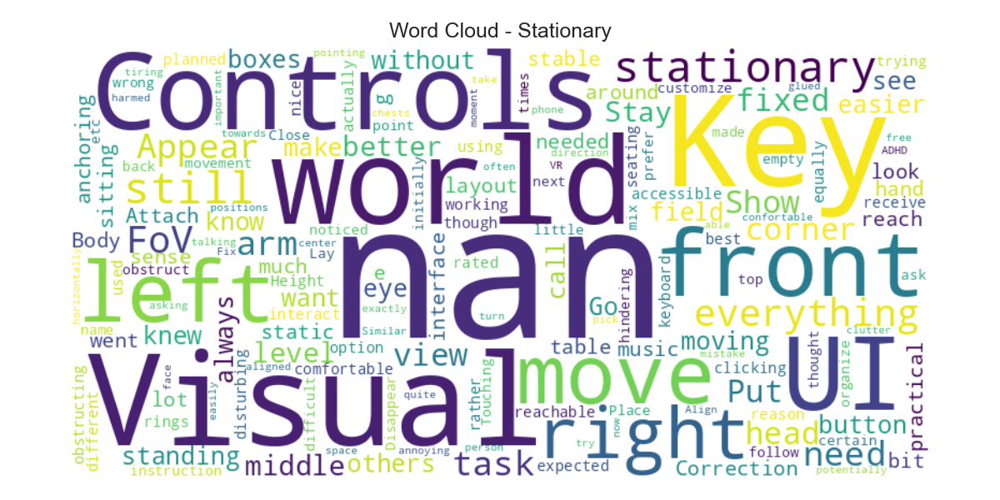

#### wordcloud_semi-stationary.png

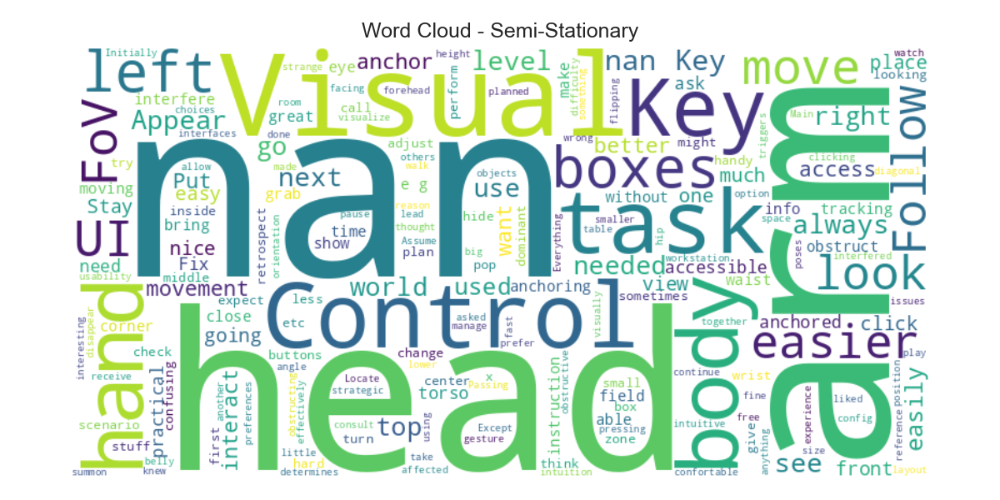

#### wordcloud_moving.png

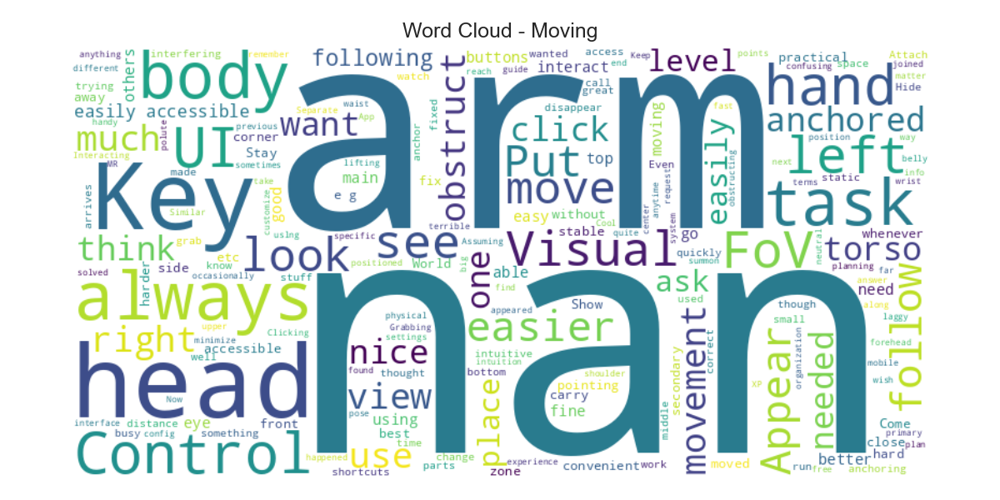

#### wordcloud_stationary.png

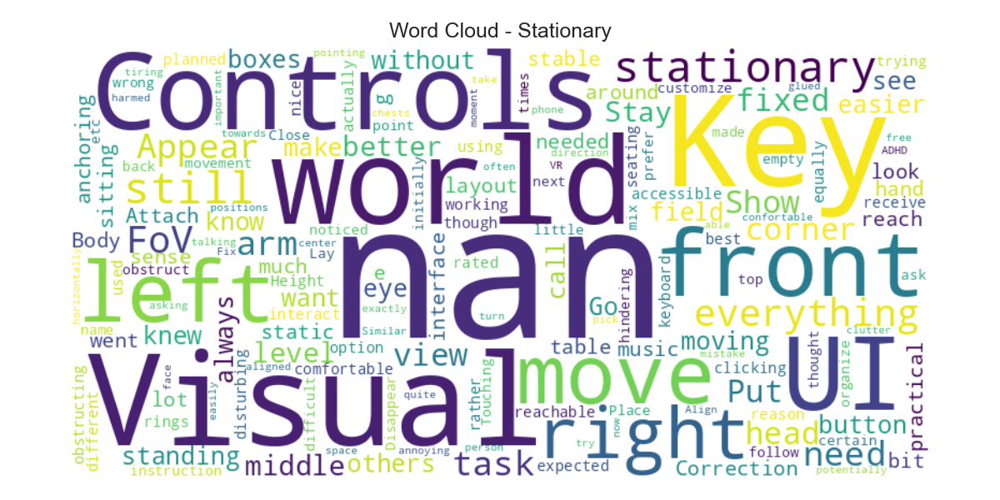

#### wordcloud_semi-stationary.png

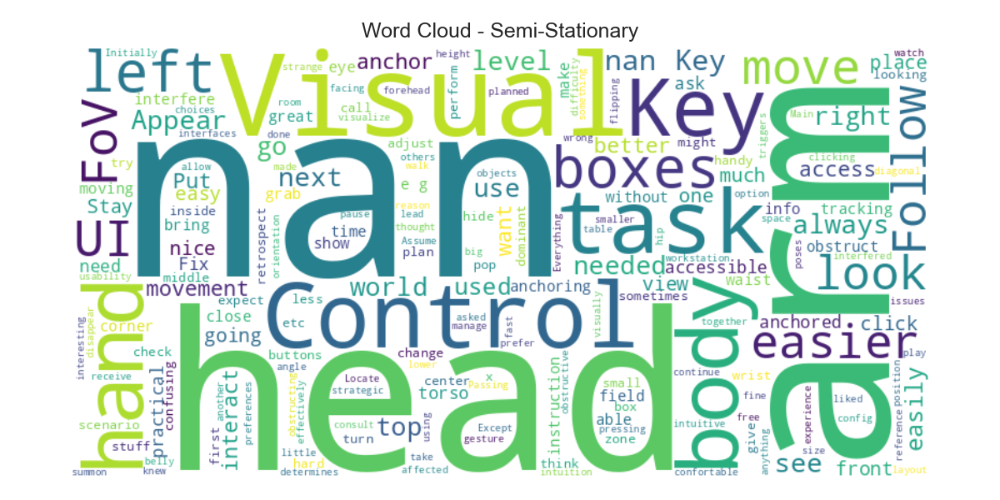

#### wordcloud_moving.png

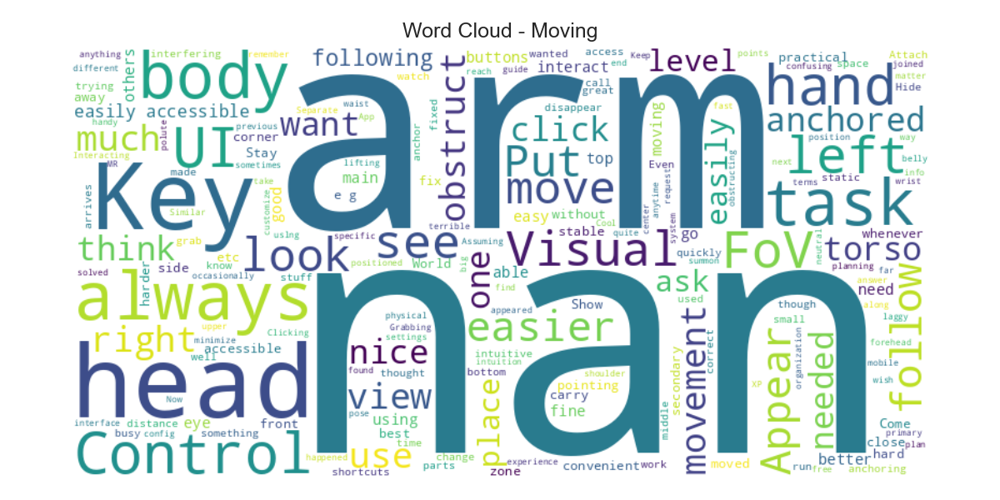

#### wordcloud_stationary.png

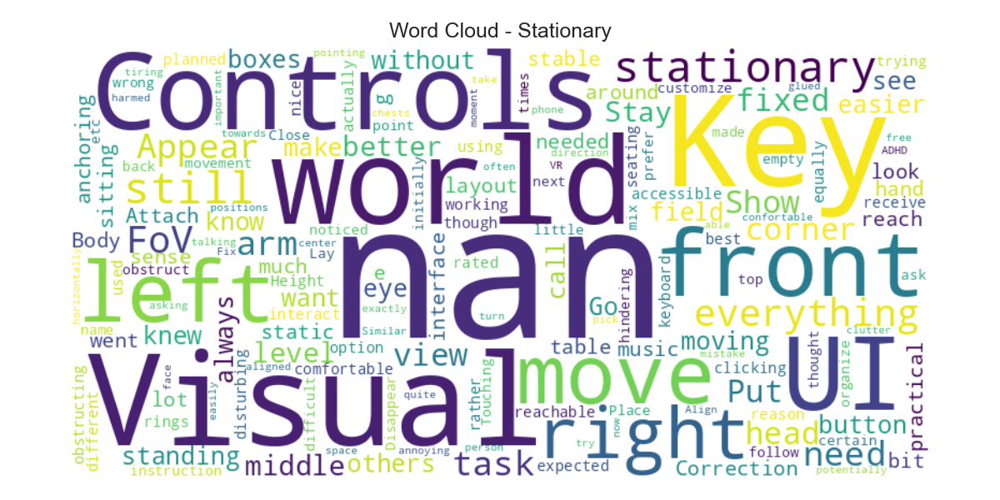

#### wordcloud_semi-stationary.png

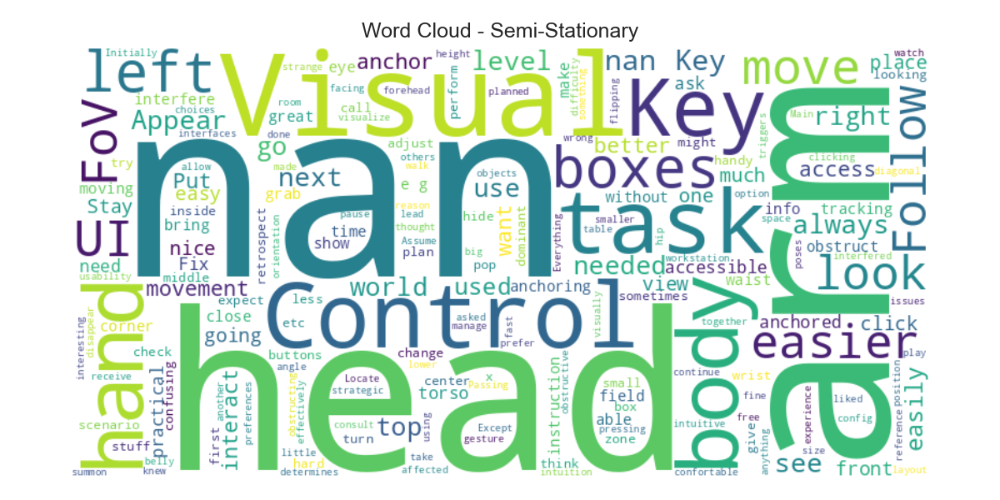

#### wordcloud_moving.png

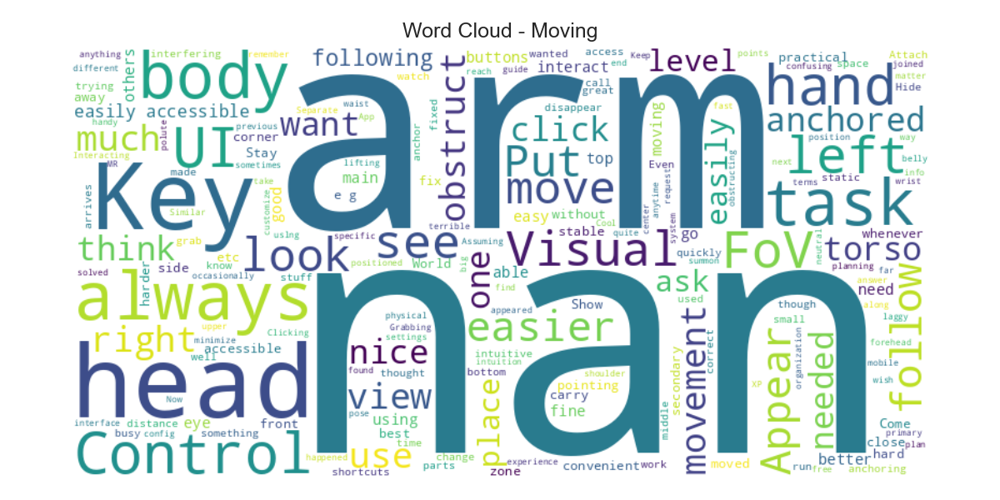

## 2.4 Sentiment analysis (transformer-based)

Data: `outputs/sentiment_transformer.csv`, `outputs/sentiment_by_condition_task.csv`

Method: multilingual transformer (XLM‑RoBERTa) applied to participants’ textual explanations; fallback to VADER where transformers are unavailable. We aggregate sentiment labels (POS/NEU/NEG) by condition and task.

Findings:
- Stationary: POS≈0.63, NEU≈0.11, NEG≈0.26 across tasks — overall positive but with more negatives referencing obstruction or button‑press friction in world‑fixed layouts.
- Semi‑Stationary: POS≈0.95, NEU≈0.05, NEG≈0.00 — the most positive condition; participants report comfortable access with little clutter.
- Moving: POS≈0.84, NEG≈0.16 — still positive, with negatives concentrated on FoV clutter for head and interaction instability when anchors don’t follow suitably.
- By task, Visual and Controls skew more positive in Moving/Semi when torso/arm strategies are mentioned; Key shows more mixed polarity in Moving when reacquisition costs loom.

Implication: Sentiment aligns with numeric preferences—when anchor–context pairing is appropriate (Stationary→World, Moving→Torso/Arm), language becomes uniformly positive; when mismatched (e.g., head while moving), negative cues rise. These patterns support rule‑based anchoring defaults with light adaptive overrides.

---

## 3) Practical implications

- Stationary: Use World anchoring by default for Key/Visual/Controls; arrange a stable layout near the task locus; permit subtle repositioning but avoid follow‑me behavior.
- Moving: Use Torso for Key/Visual to keep content in reach but out of central FoV; use Arm for Controls to minimize reach time; allow ephemeral “peek to head” for urgent, brief visual checks.
- Semi-Stationary: Prefer Torso for Visual; use Arm for Controls; choose Torso or a well‑placed World for Key depending on workspace locality.
- System design: Provide show/hide, lock, and distance tweaks; keep head‑anchored usage short‑lived to avoid clutter.

In [2]:
# Render Questionnaire report (section-aligned)
q_md = (QDIR / 'report.md').read_text(encoding='utf-8')
for title, body in split_sections(q_md):
    display(Markdown(f"## {title}"))
    if body:
        display(Markdown(body))
        render_inline_images(body, QDIR)
        render_inline_csvs(body, QDIR)
        render_assets_from_lists(body, QDIR)



## Data Analysis Report - Logs

## 1) Key performance metrics

Data: `ui_task_summary.csv`, `tidy_ui_events.csv`
- per participant×condition×task:
  - num_completions: number of TaskCompletion events.
  - mean/median/std duration (seconds) per completion.
  - accuracy: fraction of completions with Correct=True.

Findings:
- Accuracy is very high across the board (median ≈ 1.0), (I suppose that we let them to complete the task in all the conditions.) indicating the tasks were generally solved correctly under all conditions.
- Completion time patterns match the questionnaire results:
  - Controls are fastest in Stationary and remain relatively quick when Moving (median often 3–6 s), supporting Arm anchoring for at‑hand controls while moving.
  - Visual is mid‑range (≈7–13 s), with slightly longer times in Moving/Semi suggesting the cost of reacquiring information when the UI is not world‑fixed.
  - Key is slowest by far (often 25–70+ s, with some very long outliers in Moving), reflecting the complexity and location‑boundedness of the main task. Longer Key times in Moving make a strong case for torso/head anchoring to reduce reacquisition.
- Variability (std) is substantial for Key in Moving/Semi‑Stationary, consistent with heterogeneous strategies and anchor choices and supporting adaptive policies over one‑size‑fits‑all defaults.

Figures:
- Boxplot completion time by task×condition:
  - `figs/boxplot_duration_by_task_condition.png`
- Accuracy by task×condition:
  - `figs/bar_accuracy_by_task_condition.png`
- Median number of completions per participant:
  - `figs/bar_completions_by_task_condition.png`
- Heatmap mean completion time (s):
  - `figs/heatmap_mean_duration.png`

#### boxplot_duration_by_task_condition.png

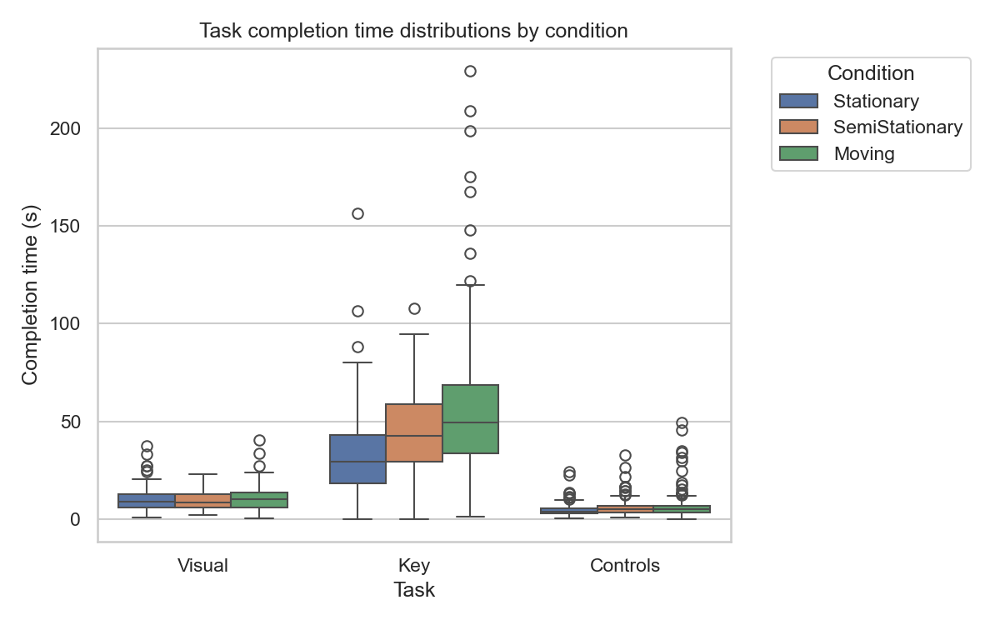

#### bar_accuracy_by_task_condition.png

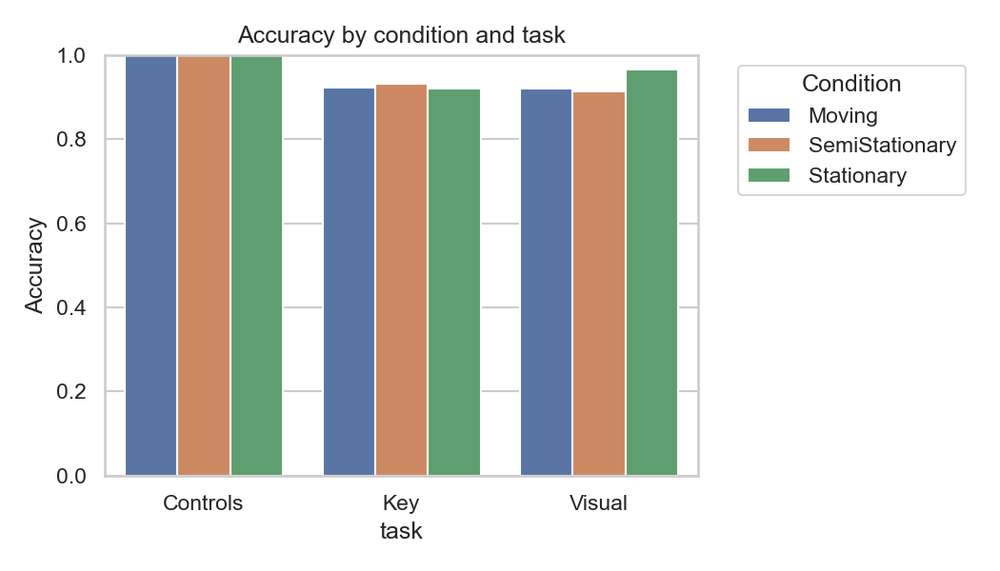

#### bar_completions_by_task_condition.png

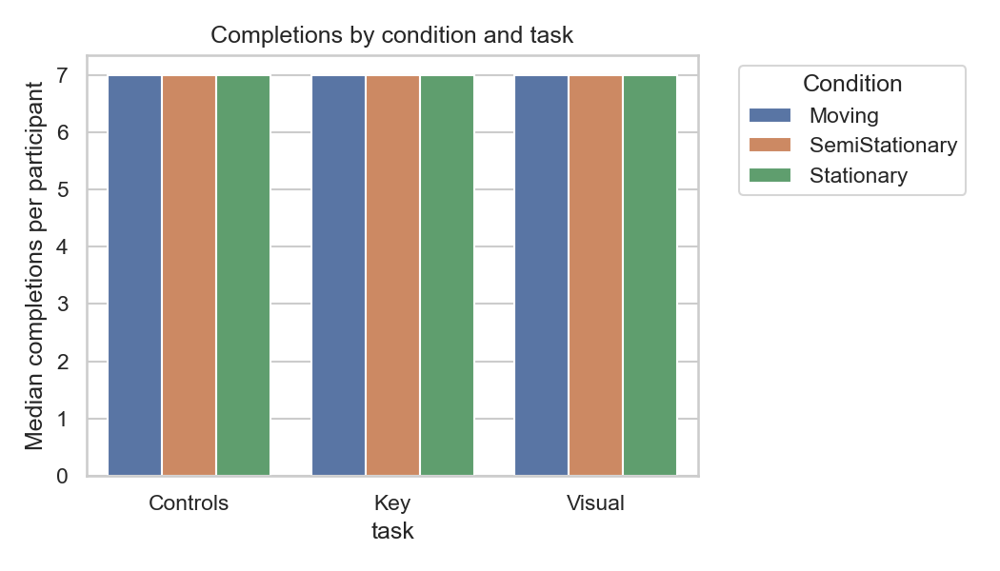

#### heatmap_mean_duration.png

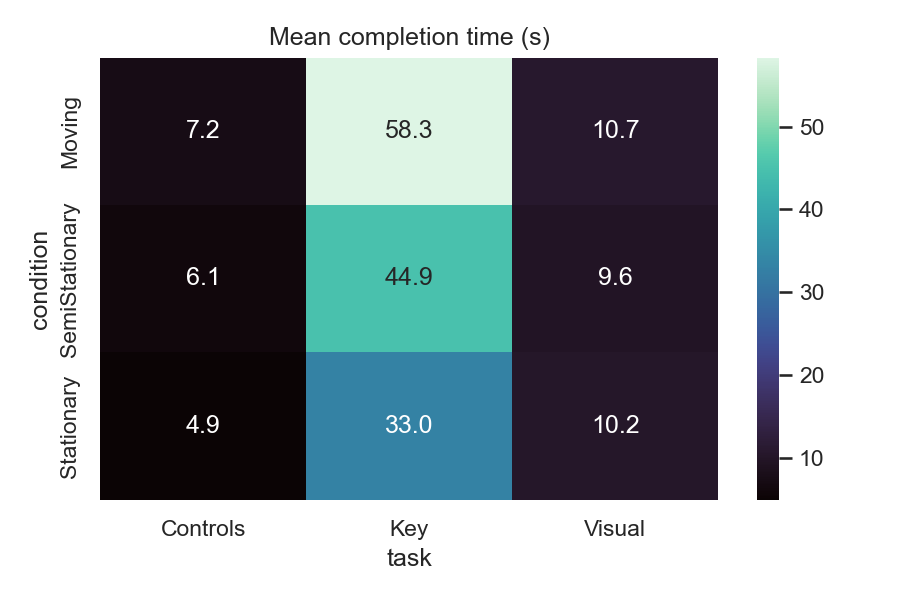

#### boxplot_duration_by_task_condition.png

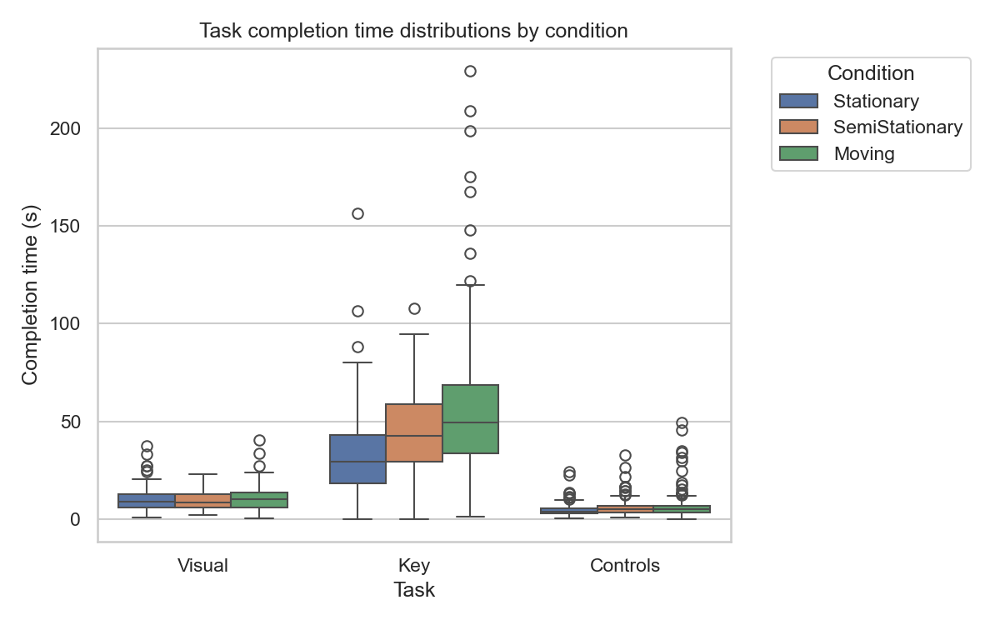

#### bar_accuracy_by_task_condition.png

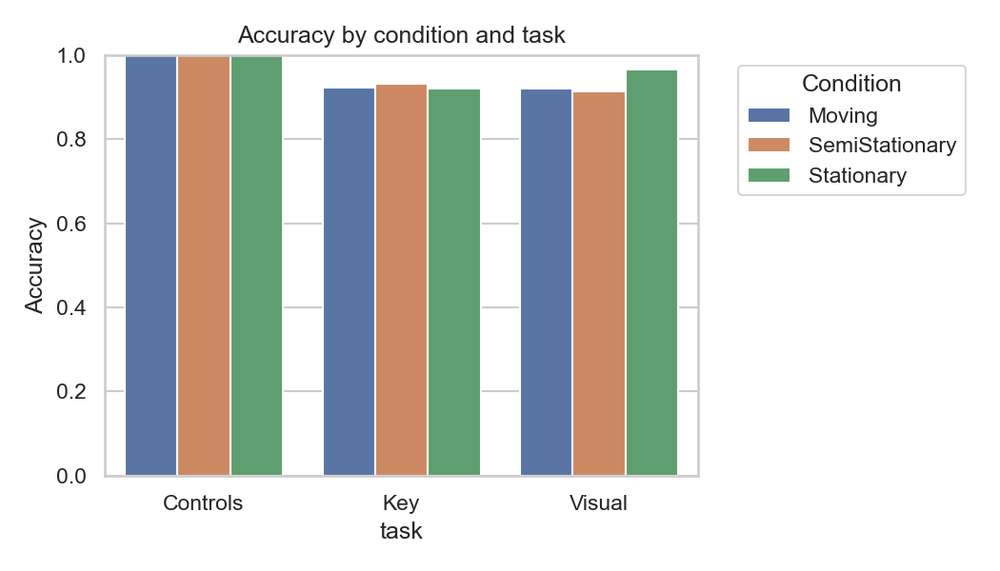

#### bar_completions_by_task_condition.png

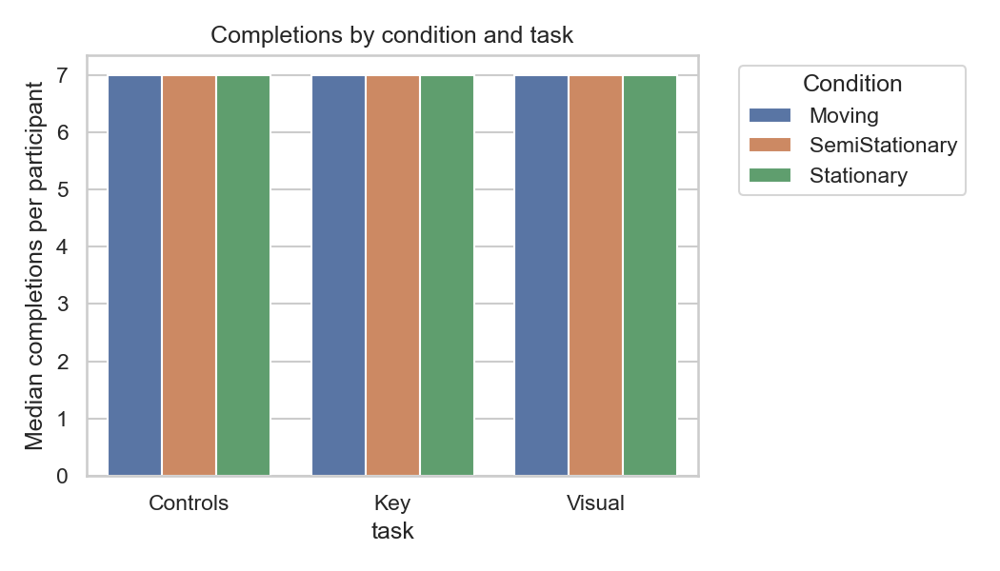

#### heatmap_mean_duration.png

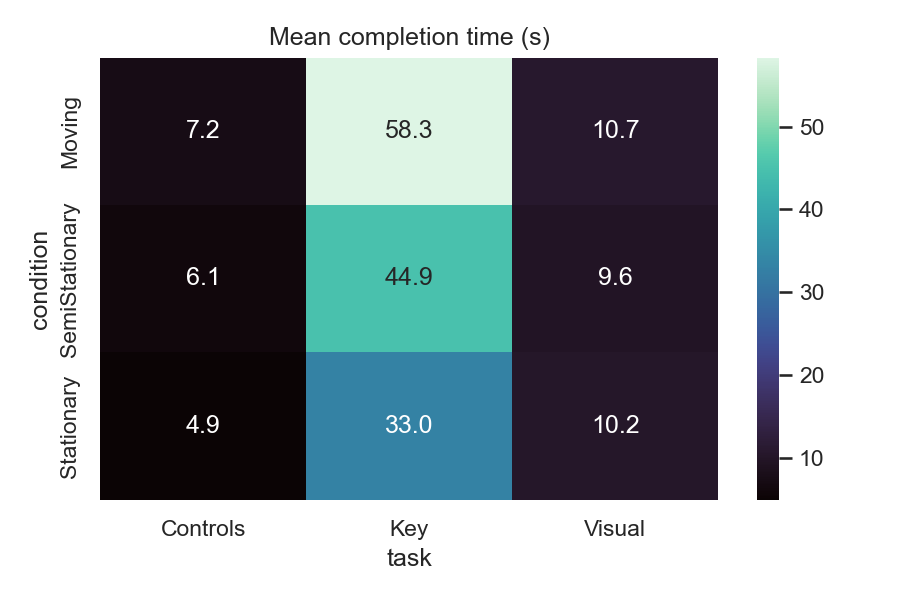

### ui_task_summary.csv

,participant,condition,task,num_completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Participant_1,Moving,Controls,12,6.138333,5.680,2.701575,1.000000
1,Participant_1,Moving,Key,10,22.602000,22.200,14.067989,0.800000
2,Participant_1,Moving,Visual,10,12.300000,13.115,6.377711,0.900000
3,Participant_1,SemiStationary,Controls,12,8.953333,7.910,4.580048,1.000000
4,Participant_1,SemiStationary,Key,10,38.698000,37.865,17.182977,1.000000
...,...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,7,34.130000,35.650,17.647877,0.714286
167,Participant_9,SemiStationary,Visual,7,7.624286,6.250,3.853331,0.857143
168,Participant_9,Stationary,Controls,7,7.518571,4.310,7.647175,1.000000
169,Participant_9,Stationary,Key,7,30.457143,22.790,19.177308,1.000000


### tidy_ui_events.csv

,participant,condition,task,event_type,coordinate_system,correct,timestamp,duration
0,Participant_1,Stationary,Visual,TaskCompletion,World,True,79.09,6.31
1,Participant_1,Stationary,Key,TaskCompletion,World,True,81.41,8.64
2,Participant_1,Stationary,Controls,TaskCompletion,World,True,96.47,0.24
3,Participant_1,Stationary,Controls,TaskCompletion,World,True,115.54,4.67
4,Participant_1,Stationary,Key,TaskCompletion,World,True,125.80,53.03
...,...,...,...,...,...,...,...,...
1591,Participant_9,Moving,Visual,Position,Torso,NaN,1172.60,0.93
1592,Participant_9,Moving,Controls,TaskCompletion,LimbLeft,True,1178.53,49.48
1593,Participant_9,Moving,Visual,Position,Torso,NaN,1193.36,0.56
1594,Participant_9,Moving,Visual,Position,Torso,NaN,1238.11,0.51


### ui_task_summary.csv

,participant,condition,task,num_completions,mean_duration_s,median_duration_s,std_duration_s,accuracy
0,Participant_1,Moving,Controls,12,6.138333,5.680,2.701575,1.000000
1,Participant_1,Moving,Key,10,22.602000,22.200,14.067989,0.800000
2,Participant_1,Moving,Visual,10,12.300000,13.115,6.377711,0.900000
3,Participant_1,SemiStationary,Controls,12,8.953333,7.910,4.580048,1.000000
4,Participant_1,SemiStationary,Key,10,38.698000,37.865,17.182977,1.000000
...,...,...,...,...,...,...,...,...
166,Participant_9,SemiStationary,Key,7,34.130000,35.650,17.647877,0.714286
167,Participant_9,SemiStationary,Visual,7,7.624286,6.250,3.853331,0.857143
168,Participant_9,Stationary,Controls,7,7.518571,4.310,7.647175,1.000000
169,Participant_9,Stationary,Key,7,30.457143,22.790,19.177308,1.000000


### tidy_ui_events.csv

,participant,condition,task,event_type,coordinate_system,correct,timestamp,duration
0,Participant_1,Stationary,Visual,TaskCompletion,World,True,79.09,6.31
1,Participant_1,Stationary,Key,TaskCompletion,World,True,81.41,8.64
2,Participant_1,Stationary,Controls,TaskCompletion,World,True,96.47,0.24
3,Participant_1,Stationary,Controls,TaskCompletion,World,True,115.54,4.67
4,Participant_1,Stationary,Key,TaskCompletion,World,True,125.80,53.03
...,...,...,...,...,...,...,...,...
1591,Participant_9,Moving,Visual,Position,Torso,NaN,1172.60,0.93
1592,Participant_9,Moving,Controls,TaskCompletion,LimbLeft,True,1178.53,49.48
1593,Participant_9,Moving,Visual,Position,Torso,NaN,1193.36,0.56
1594,Participant_9,Moving,Visual,Position,Torso,NaN,1238.11,0.51


#### boxplot_duration_by_task_condition.png

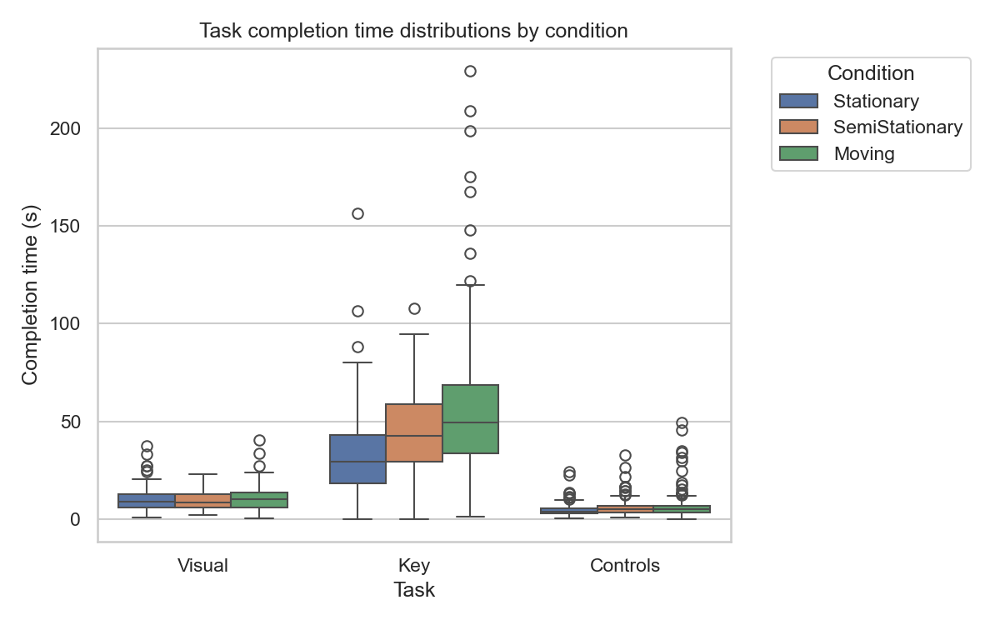

#### bar_accuracy_by_task_condition.png

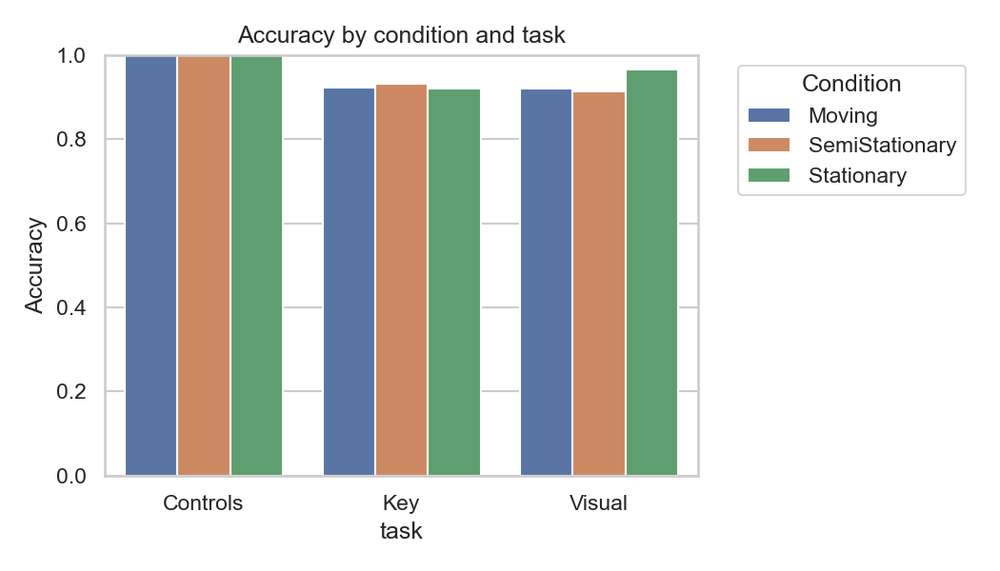

#### bar_completions_by_task_condition.png

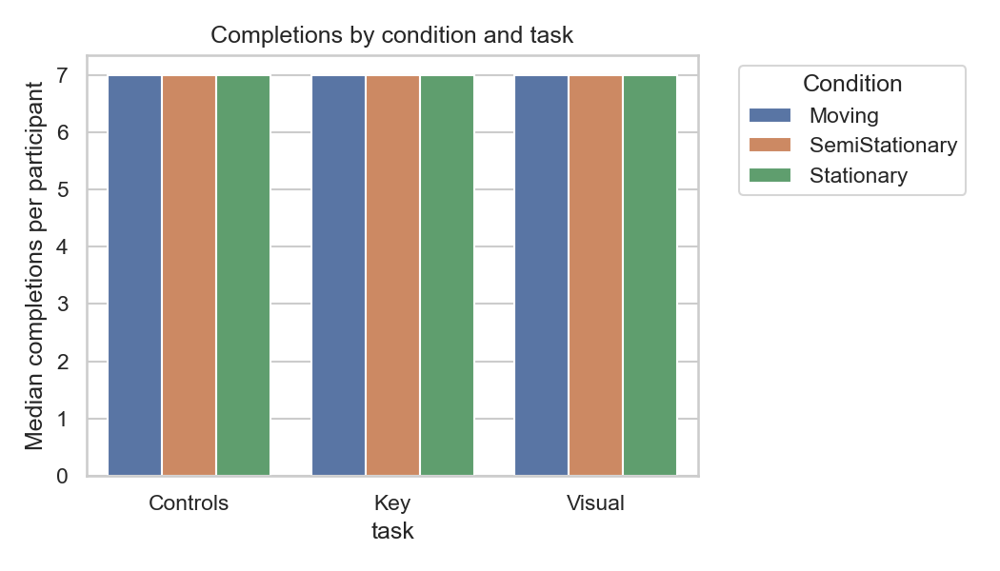

#### heatmap_mean_duration.png

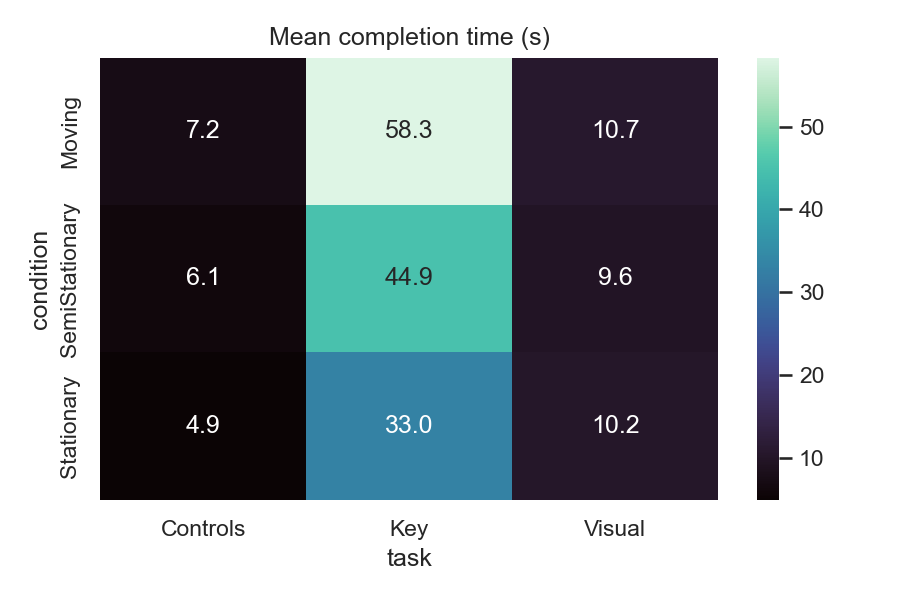

## 2) Motion capture summaries

Data: `motion_summary.csv`
- Capture rates were 10 Hz (Stationary) and 15 Hz (Semi/Moving) with long durations (≈4–13 minutes per condition), and fraction_valid ≈ 1.0 for most recordings.

Figures:
- Average motion recording duration by condition:
  - `figs/bar_motion_duration_by_condition.png`

#### bar_motion_duration_by_condition.png

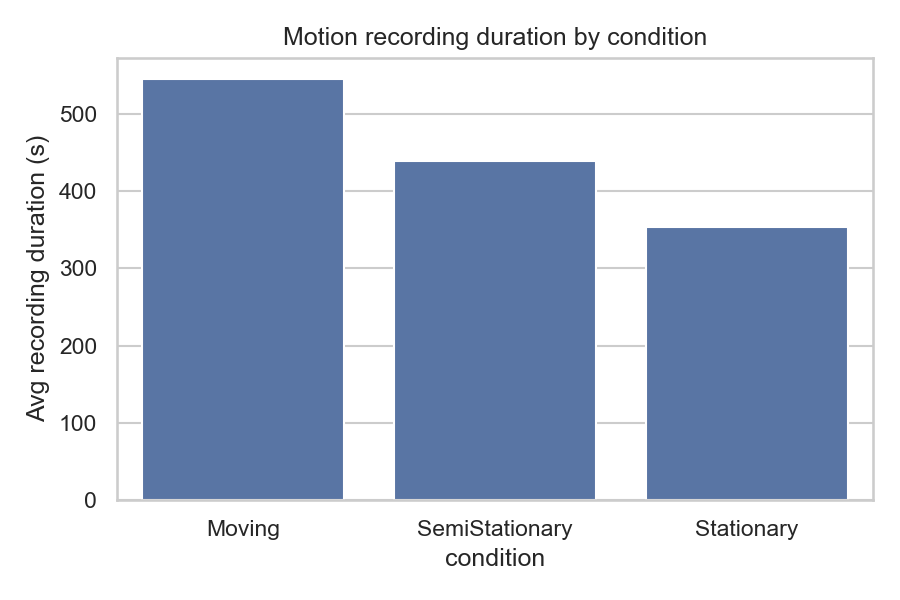

#### bar_motion_duration_by_condition.png

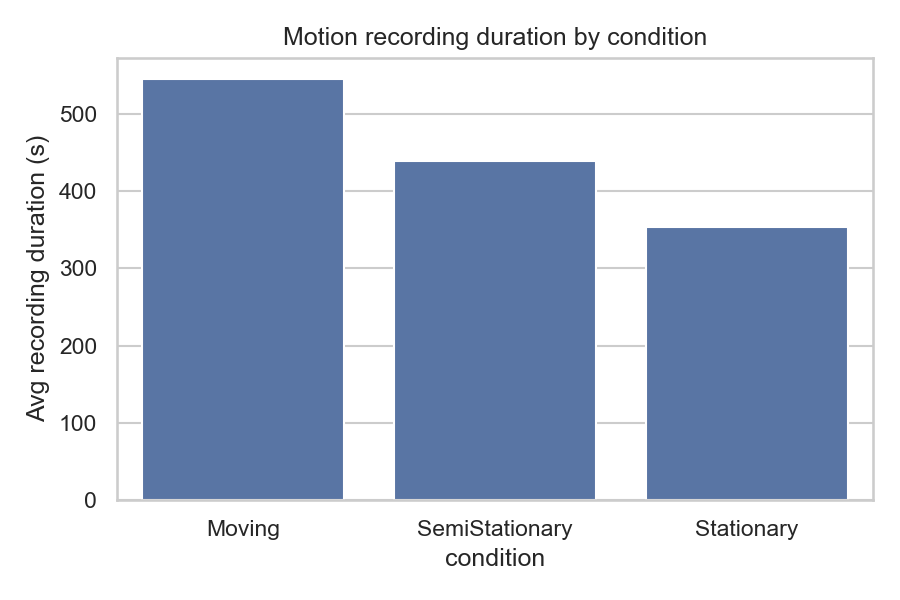

### motion_summary.csv

,participant,condition,capture_rate_hz,total_frames,duration_seconds,fraction_valid
0,Participant_1,Stationary,10.0,3814.0,423.065552,0.000000
1,Participant_1,SemiStationary,15.0,7933.0,552.774460,1.000000
2,Participant_1,Moving,15.0,7882.0,548.565491,1.000000
3,Participant_10,Stationary,10.0,2567.0,284.741020,1.000000
4,Participant_10,SemiStationary,15.0,5216.0,363.738739,1.000000
5,Participant_10,Moving,15.0,5417.0,377.667664,1.000000
6,Participant_11,Stationary,10.0,4490.0,498.403229,1.000000
7,Participant_11,SemiStationary,15.0,5660.0,394.661743,1.000000
8,Participant_11,Moving,15.0,7076.0,492.680084,1.000000
9,Participant_12,Stationary,10.0,2845.0,315.701263,1.000000


### motion_summary.csv

,participant,condition,capture_rate_hz,total_frames,duration_seconds,fraction_valid
0,Participant_1,Stationary,10.0,3814.0,423.065552,0.000000
1,Participant_1,SemiStationary,15.0,7933.0,552.774460,1.000000
2,Participant_1,Moving,15.0,7882.0,548.565491,1.000000
3,Participant_10,Stationary,10.0,2567.0,284.741020,1.000000
4,Participant_10,SemiStationary,15.0,5216.0,363.738739,1.000000
5,Participant_10,Moving,15.0,5417.0,377.667664,1.000000
6,Participant_11,Stationary,10.0,4490.0,498.403229,1.000000
7,Participant_11,SemiStationary,15.0,5660.0,394.661743,1.000000
8,Participant_11,Moving,15.0,7076.0,492.680084,1.000000
9,Participant_12,Stationary,10.0,2845.0,315.701263,1.000000


#### bar_motion_duration_by_condition.png

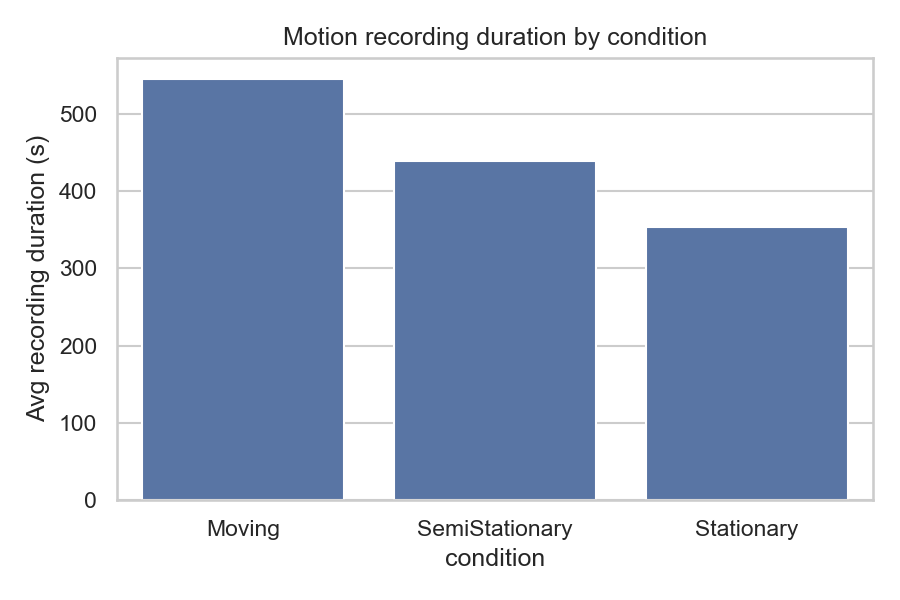

## 3) Inter-completion intervals

Data: `inter_completion_intervals.csv`, `inter_completion_summary.csv`

Findings:
- Across participants, mean intervals tend to be lowest in Stationary (≈9–18 s for many users), higher in Semi‑Stationary (≈15–25 s), and highest in Moving for several participants (often >20 s, with a few very large means reflecting pauses/outliers). This pattern suggests more idle/search or multitasking overhead when motion increases.
- Implication: favor anchors that reduce reacquisition while moving (Torso/Head for monitoring; Arm for quick actions) to shrink idle gaps between completions.

### inter_completion_intervals.csv

,participant,condition,timestamp,interval_s
0,Participant_1,Moving,602.66,24.35
1,Participant_1,Moving,620.00,17.34
2,Participant_1,Moving,637.75,17.75
3,Participant_1,Moving,659.60,21.85
4,Participant_1,Moving,671.84,12.24
...,...,...,...,...
1186,Participant_9,Stationary,500.80,11.86
1187,Participant_9,Stationary,508.22,7.42
1188,Participant_9,Stationary,521.37,13.15
1189,Participant_9,Stationary,537.41,16.04


### inter_completion_summary.csv

,participant,condition,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,16.964194,17.750,9.018876,31
1,Participant_1,SemiStationary,16.132812,17.880,8.498916,32
2,Participant_1,Stationary,12.034545,12.020,8.071039,33
3,Participant_10,Moving,18.042000,16.780,8.716111,20
4,Participant_10,SemiStationary,16.807143,15.380,9.458982,21
5,Participant_10,Stationary,13.619000,14.510,6.062982,20
6,Participant_11,Moving,23.823500,19.680,17.389561,20
7,Participant_11,SemiStationary,18.985500,18.250,6.508061,20
8,Participant_11,Stationary,23.389500,23.290,11.092348,20
9,Participant_12,Moving,19.187000,15.765,12.631952,20


### inter_completion_intervals.csv

,participant,condition,timestamp,interval_s
0,Participant_1,Moving,602.66,24.35
1,Participant_1,Moving,620.00,17.34
2,Participant_1,Moving,637.75,17.75
3,Participant_1,Moving,659.60,21.85
4,Participant_1,Moving,671.84,12.24
...,...,...,...,...
1186,Participant_9,Stationary,500.80,11.86
1187,Participant_9,Stationary,508.22,7.42
1188,Participant_9,Stationary,521.37,13.15
1189,Participant_9,Stationary,537.41,16.04


### inter_completion_summary.csv

,participant,condition,mean_interval_s,median_interval_s,std_interval_s,count
0,Participant_1,Moving,16.964194,17.750,9.018876,31
1,Participant_1,SemiStationary,16.132812,17.880,8.498916,32
2,Participant_1,Stationary,12.034545,12.020,8.071039,33
3,Participant_10,Moving,18.042000,16.780,8.716111,20
4,Participant_10,SemiStationary,16.807143,15.380,9.458982,21
5,Participant_10,Stationary,13.619000,14.510,6.062982,20
6,Participant_11,Moving,23.823500,19.680,17.389561,20
7,Participant_11,SemiStationary,18.985500,18.250,6.508061,20
8,Participant_11,Stationary,23.389500,23.290,11.092348,20
9,Participant_12,Moving,19.187000,15.765,12.631952,20


In [3]:
# Render StudyLogs report (section-aligned)
l_md_path = LDIR / 'report.md'
if l_md_path.exists():
    l_md = l_md_path.read_text(encoding='utf-8')
    for title, body in split_sections(l_md):
        display(Markdown(f"## {title}"))
        if body:
            display(Markdown(body))
            render_inline_images(body, LDIR)
            render_inline_csvs(body, LDIR)
            render_assets_from_lists(body, LDIR)
else:
    display(Markdown('Logs report not found.'))
